# 💀  Problem Statement

The aim of this data science project is to build a `predictive model` and find out the sales of each product at a particular store.
Using this model, `BigMart` will try to understand the properties of products and stores which play a key role in increasing sales.

________________

# 💭 Hypothesis 

1. **Product Weight and Sales**
- Null Hypothesis (H0): The weight of a product does not significantly affect its sales.
* Alternative Hypothesis (H1): The weight of a product significantly influences its sales.
+ Rationale: It is possible that heavier products might be perceived as higher value or better quality, leading to increased sales.
2. **Fat Content of Items and Sales**
- Null Hypothesis (H0): The fat content of items does not significantly influence their sales.
+ Alternative Hypothesis (H1): The fat content of items significantly affects their sales.
* Rationale: Consumers' preferences for healthier options or indulgent products may affect sales based on the fat content of items.
3. **Product Visibility and Sales**
- Null Hypothesis (H0): The visibility of a product does not significantly impact its sales.
- Alternative Hypothesis (H1): The visibility of a product significantly influences its sales.
- Rationale: Products with higher visibility on store shelves might attract more customers and result in increased sales.

4. **Item Type and Sales**
- Null Hypothesis (H0): The type of a product does not significantly affect its sales.
- Alternative Hypothesis (H1): The type of a product significantly influences its sales.
- Rationale: Certain item types, such as electronics or perishables, may have varying demand levels and sales patterns.

5. **Product Maximum Retail Price (MRP) and Sales**
- Null Hypothesis (H0): The maximum retail price (MRP) of a product does not significantly impact its sales.
- Alternative Hypothesis (H1): The maximum retail price (MRP) of a product significantly affects its sales.
- Rationale: Higher MRP might imply premium products, and their sales could be influenced by perceived value or quality.

6. **Store Size and Sales**
- Null Hypothesis (H0): The size of a store does not have a significant impact on the sales of products in that store.
- Alternative Hypothesis (H1): The size of a store has a significant impact on the sales of products in that store.
- Rationale: Stores with more shelf space might have the capacity to stock a larger variety of products, potentially leading to increased sales.

7. **Store Location and Sales**
- Null Hypothesis (H0): The location of a store does not significantly affect the sales of products in that store.
- Alternative Hypothesis (H1): The location of a store significantly affects the sales of products in that store.
- Rationale: Stores situated in different neighborhoods or cities might experience varying levels of customer footfall and preferences.

8. **Store Type and Sales**
- Null Hypothesis (H0): The type of store does not have a significant impact on product sales.
- Alternative Hypothesis (H1): The type of store significantly influences product sales.
- Rationale: Different store types, such as supermarkets or grocery stores, may have distinct customer demographics and purchase behaviors, which could impact sales.

9. **Outlet Age and Sales**
- Null Hypothesis (H0): The age of an outlet does not significantly affect its product sales.
- Alternative Hypothesis (H1): The age of an outlet significantly affects its product sales.
- Rationale: Older outlets may have established customer loyalty and awareness, potentially leading to higher sales.

10. **Outlet Size and Sales**
- Null Hypothesis (H0): The size of an outlet does not have a significant impact on its product sales.
- Alternative Hypothesis (H1): The size of an outlet has a significant impact on its product sales.
- Rationale: Larger outlets might attract more customers due to a broader product selection and spacious shopping environment, leading to higher sales.

_______

# 📚 Libraries  & Data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
from scipy import stats
import pylab
import plotly.express as px
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, KFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
import joblib
import xgboost as xgb



# Ignore the SettingWithCopyWarning
pd.options.mode.chained_assignment = None

# #Revert the option to the default behavior (show warning)
# pd.options.mode.chained_assignment = 'warn'

In [2]:
def load_data(filename):
    return pd.read_csv(filename)

In [3]:
train = load_data('train.csv')
test = load_data('test.csv')

In [4]:
display(train.columns, test.columns)

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Outlet_Sales'],
      dtype='object')

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type'],
      dtype='object')

___

# 🏗️ Data Structure and Content

In [5]:
train.sample(7)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
2280,FDS24,20.850,Regular,0.062213,Baking Goods,88.1514,OUT035,2004,Small,Tier 2,Supermarket Type1,1151.1682
1167,FDA50,16.250,Low Fat,0.087668,Dairy,94.9410,OUT017,2007,NaN,Tier 2,Supermarket Type1,1737.7380
5156,NCX05,15.200,Low Fat,0.097259,Health and Hygiene,114.8492,OUT045,2002,NaN,Tier 2,Supermarket Type1,1506.0396
2761,FDF33,7.970,LF,0.021531,Seafood,108.4596,OUT035,2004,Small,Tier 2,Supermarket Type1,3020.0688
5543,FDH12,9.600,Low Fat,0.085086,Baking Goods,105.1280,OUT049,1999,Medium,Tier 1,Supermarket Type1,1065.2800
2185,FDL24,10.300,Regular,0.024876,Baking Goods,173.0422,OUT013,1987,High,Tier 3,Supermarket Type1,2069.3064
6050,NCY18,7.285,Low Fat,0.031200,Household,174.7054,OUT049,1999,Medium,Tier 1,Supermarket Type1,6303.7944


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [7]:
train.describe(exclude=[np.number])

,Item_Identifier,Item_Fat_Content,Item_Type,Outlet_Identifier,Outlet_Size,Outlet_Location_Type,Outlet_Type
count,8523,8523,8523,8523,6113,8523,8523
unique,1559,5,16,10,3,3,4
top,FDW13,Low Fat,Fruits and Vegetables,OUT027,Medium,Tier 3,Supermarket Type1
freq,10,5089,1232,935,2793,3350,5577


In [8]:
train.describe(exclude=object)

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


In [9]:
train.isna().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

## Conclusion about structure 

- The dataset contains 8,523 observations representing different products and their sales across various outlets. The dataset consists of 12 attributes, containing both numerical and categorical information about the items and outlets.
- The dataset includes five numerical attributes: Item_Weight, Item_Visibility, Item_MRP, Outlet_Establishment_Year, and Item_Outlet_Sales.
- The dataset includes several categorical attributes: Item_Identifier, Item_Fat_Content, Item_Type, Outlet_Identifier, Outlet_Size, Outlet_Location_Type, and Outlet_Type.
- The attributes Item_Weight and Outlet_Size have some missing values.

___

# 🔍 Exploratory Data Analysis

## 1. Univariate

**Univariate statistics:** involves the analysis of a single variable at a time. It focuses on understanding the distribution and properties of that variable without considering the relationships with other variables.

In [10]:
def separate_cat_and_num_attributes(df):
    """
    Separate DataFrame columns into categorical and numerical attributes.

    Parameters:
        df (pandas DataFrame): The DataFrame containing the data.

    Returns:
        cat (list): List of column names representing categorical attributes.
        num (list): List of column names representing numerical attributes.
    """
    cat = list(df.select_dtypes(include='object').columns)
    num = list(df.select_dtypes(exclude='object').columns)
    return df[cat], df[num]


In [11]:
categorical, numerical = separate_cat_and_num_attributes(train)

In [12]:
numerical

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
0,9.300,0.016047,249.8092,1999,3735.1380
1,5.920,0.019278,48.2692,2009,443.4228
2,17.500,0.016760,141.6180,1999,2097.2700
3,19.200,0.000000,182.0950,1998,732.3800
4,8.930,0.000000,53.8614,1987,994.7052
...,...,...,...,...,...
8518,6.865,0.056783,214.5218,1987,2778.3834
8519,8.380,0.046982,108.1570,2002,549.2850
8520,10.600,0.035186,85.1224,2004,1193.1136
8521,7.210,0.145221,103.1332,2009,1845.5976


In [13]:
def descriptive_numbers(num):
    mapping = {}
    measures = ['mean', 'median', 'std', 'range', 'IQR', '# of missing value']
    for column in num.columns:
        column_data = num[column]
        mapping[column] = [
            column_data.mean(),
            column_data.median(),
            column_data.std(),
            f"{column_data.min()} - {column_data.max()}",
            column_data.quantile(0.75) - column_data.quantile(0.25),
            column_data.isna().sum()
        ]
        
    return pd.DataFrame(mapping, index=measures).T

def descriptive_categorical(cat):
    mapping = {}
    measures = ['count', 'unique', '# of unique', '# of missing values']
    for column in cat.columns:
        column_data = cat[column]
        mapping[column] = [
            column_data.count(),
            column_data.unique(),
            len(column_data.unique()),
            column_data.isna().sum()
        ]
        
    return pd.DataFrame(mapping, index=measures).T

def owen_describe(df):
    for i in df:
        print(f"################# {i} #################")
        print(f"{df[i]}\n")

In [14]:
descriptive_nums = descriptive_numbers(numerical)

In [15]:
owen_describe(descriptive_nums)

################# mean #################
Item_Weight                    12.857645
Item_Visibility                 0.066132
Item_MRP                      140.992782
Outlet_Establishment_Year    1997.831867
Item_Outlet_Sales            2181.288914
Name: mean, dtype: object

################# median #################
Item_Weight                      12.6
Item_Visibility              0.053931
Item_MRP                     143.0128
Outlet_Establishment_Year      1999.0
Item_Outlet_Sales            1794.331
Name: median, dtype: object

################# std #################
Item_Weight                     4.643456
Item_Visibility                 0.051598
Item_MRP                       62.275067
Outlet_Establishment_Year        8.37176
Item_Outlet_Sales            1706.499616
Name: std, dtype: object

################# range #################
Item_Weight                       4.555 - 21.35
Item_Visibility               0.0 - 0.328390948
Item_MRP                       31.29 - 266.8884
Outlet_E

In [16]:
descriptive_cats = descriptive_categorical(categorical)

In [17]:
owen_describe(descriptive_cats)

################# count #################
Item_Identifier         8523
Item_Fat_Content        8523
Item_Type               8523
Outlet_Identifier       8523
Outlet_Size             6113
Outlet_Location_Type    8523
Outlet_Type             8523
Name: count, dtype: object

################# unique #################
Item_Identifier         [FDA15, DRC01, FDN15, FDX07, NCD19, FDP36, FDO...
Item_Fat_Content                     [Low Fat, Regular, low fat, LF, reg]
Item_Type               [Dairy, Soft Drinks, Meat, Fruits and Vegetabl...
Outlet_Identifier       [OUT049, OUT018, OUT010, OUT013, OUT027, OUT04...
Outlet_Size                                    [Medium, nan, High, Small]
Outlet_Location_Type                             [Tier 1, Tier 3, Tier 2]
Outlet_Type             [Supermarket Type1, Supermarket Type2, Grocery...
Name: unique, dtype: object

################# # of unique #################
Item_Identifier         1559
Item_Fat_Content           5
Item_Type                 16
Ou

In [18]:
def univariate_eda(df):
    # style of grid
    plt.style.use('seaborn-dark')
    
    fig, axes = plt.subplots(5, 3, figsize=(22, 22))
    plt.tight_layout(pad=4)

    # Loop through each numerical column and create the plots
    for i, column in enumerate(df.columns):
        ax_histogram = axes[i, 0]
        ax_boxplot = axes[i, 1]
        ax_scatter = axes[i, 2]

        # Histogram with KDE
        sns.histplot(df[column], ax=ax_histogram)
        ax_histogram.set_title(f'{column} Distribution')
        ax_histogram.set_xlabel(column)
        ax_histogram.set_ylabel('Frequency')

        # Box Plot
        sns.boxplot(y=df[column], ax=ax_boxplot)
        ax_boxplot.set_title(f'{column} Box Plot')
        ax_boxplot.set_ylabel(column)

        # Scatter Plot (assuming there's another numerical column for comparison)
        if len(df.columns) > 1:
            for j in range(i + 1, len(df.columns)):
                ax_scatter = axes[i, 2]
                sns.scatterplot(x=column, y=df.columns[j], data=df, ax=ax_scatter)
                ax_scatter.set_title(f'{column} vs. {df.columns[j]}')
                ax_scatter.set_xlabel(column)
                ax_scatter.set_ylabel(df.columns[j])

    plt.show()


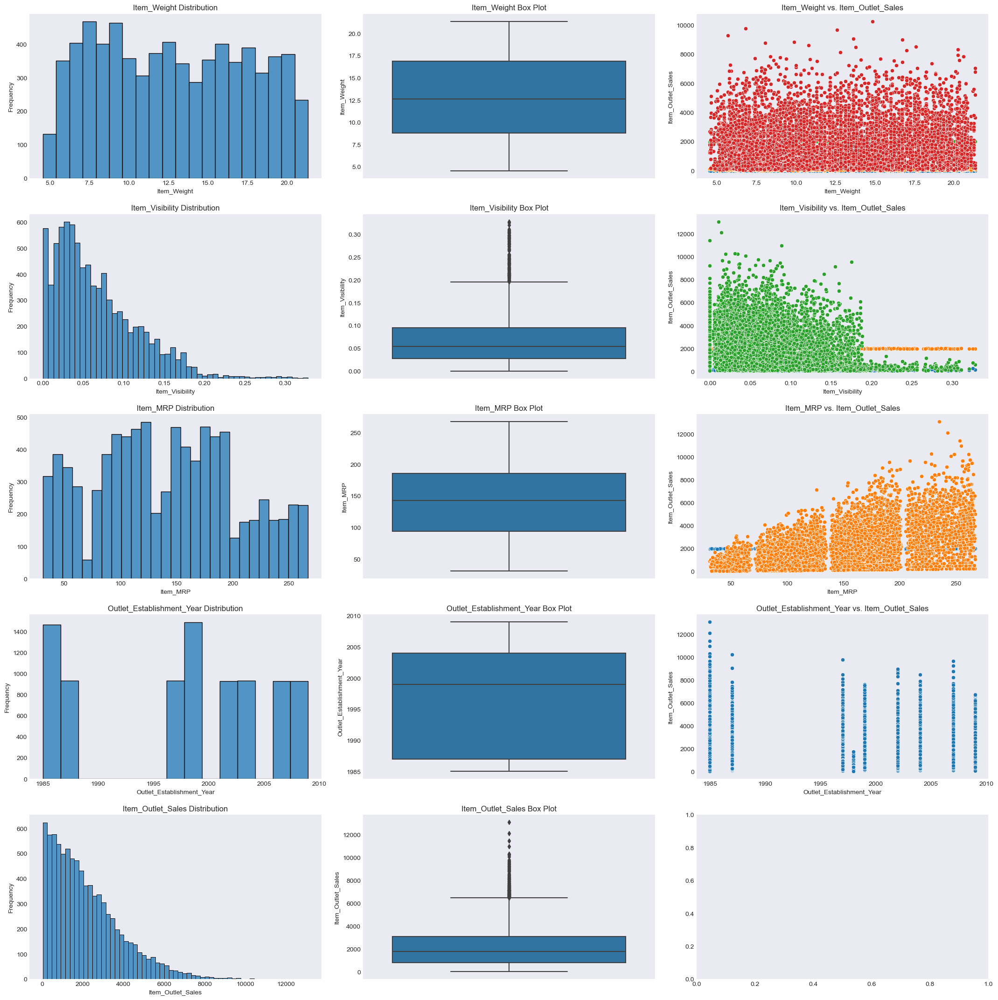

In [19]:
univariate_eda(numerical)

In [20]:
def univariate_eda_bar_categorical(df):
    df = df.iloc[:,1:]
    num_rows = len(df.columns)
    num_cols = 1
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(8, 6))
    plt.tight_layout(pad=4)
    
    # Loop through each categorical column and create the plots
    for i, column in enumerate(df.columns):
        ax_bar = axes[i] if num_rows > 1 else axes  # Get the current axis

        # Bar Plot
        value_counts = df[column].value_counts()
        labels = value_counts.index
        values = value_counts.values

        fig = go.Figure(data=[go.Bar(x=labels, y=values)])
        fig.update_layout(title=f'{column} Bar Plot', xaxis_title=column, yaxis_title='Count')
        fig.show()

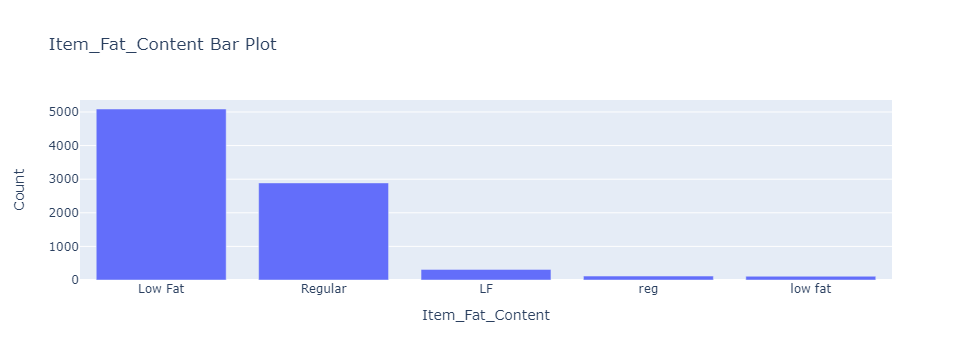

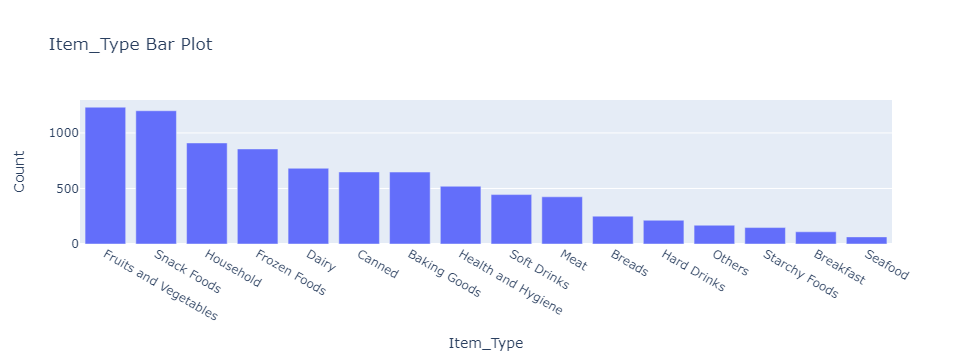

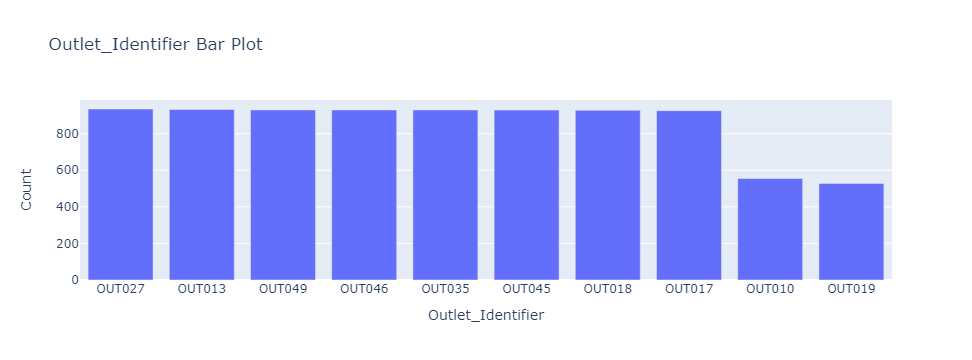

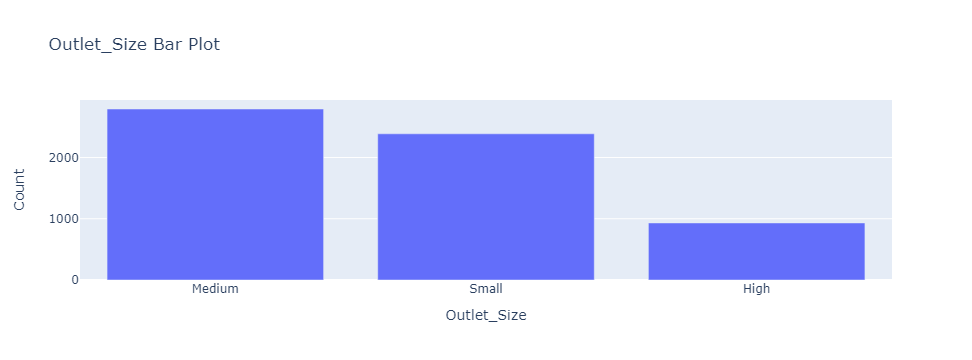

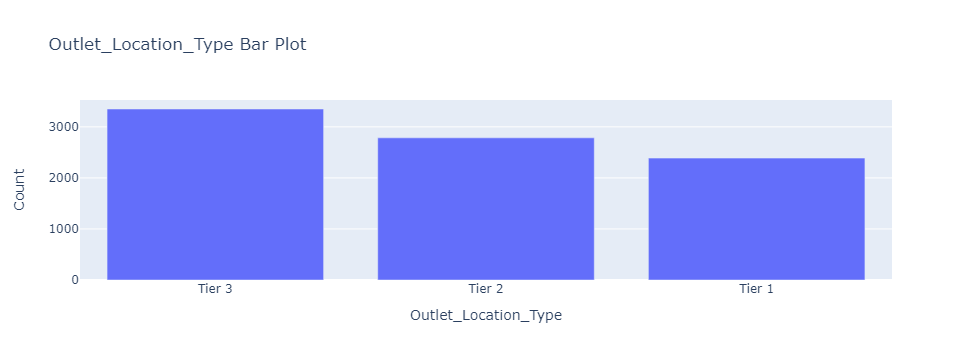

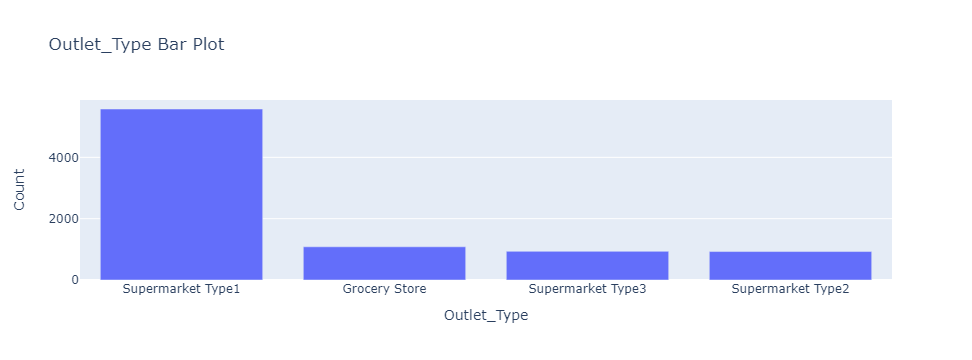

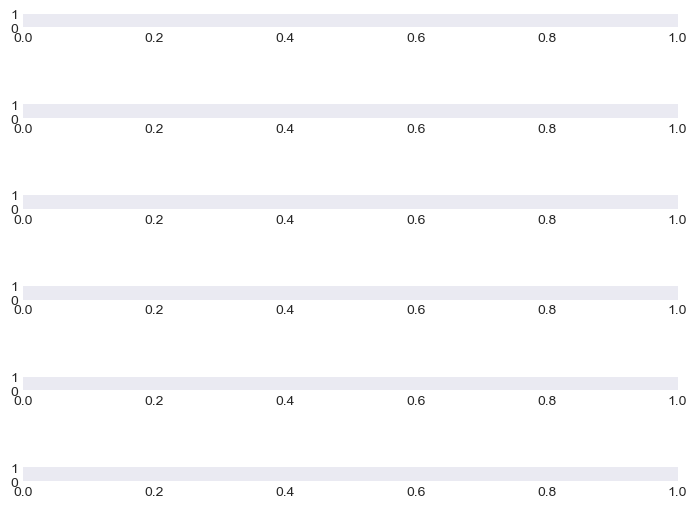

In [21]:
univariate_eda_bar_categorical(categorical)

In [22]:
def univariate_eda_pie_categorical(df):
    # Filter out the non-categorical columns (excluding the first column)
    categorical_df = df.iloc[:, 1:]
    num_rows, num_cols = len(categorical_df.columns), 1

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(8, 6))
    plt.tight_layout(pad=4)
    
     # Loop through each categorical column and create the plots
    for i, column in enumerate(categorical_df.columns):
        ax_pie = axes[i] if num_rows > 1 else axes  # Get the current axis

        num_categories = len(categorical_df[column].unique())
        colors = plt.cm.tab20.colors[:num_categories]

        # Pie Chart with dynamic values
        value_counts = categorical_df[column].value_counts()
        labels = value_counts.index
        values = value_counts.values

        fig = go.Figure(data=[go.Pie(labels=labels, values=values, marker=dict(colors=colors))])
        fig.update_traces(hoverinfo='label+percent', textinfo='percent')
        fig.update_layout(title=f'{column} Distribution')
        fig.show()

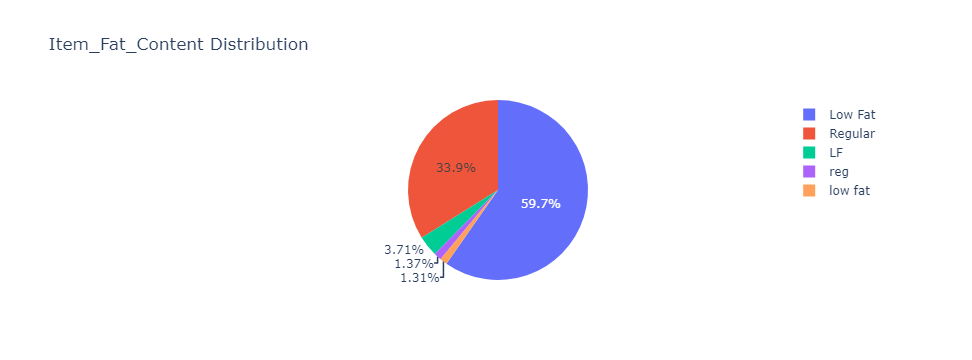

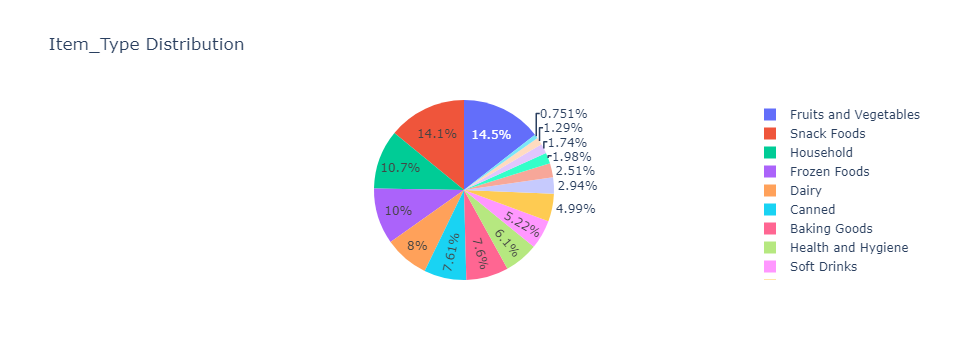

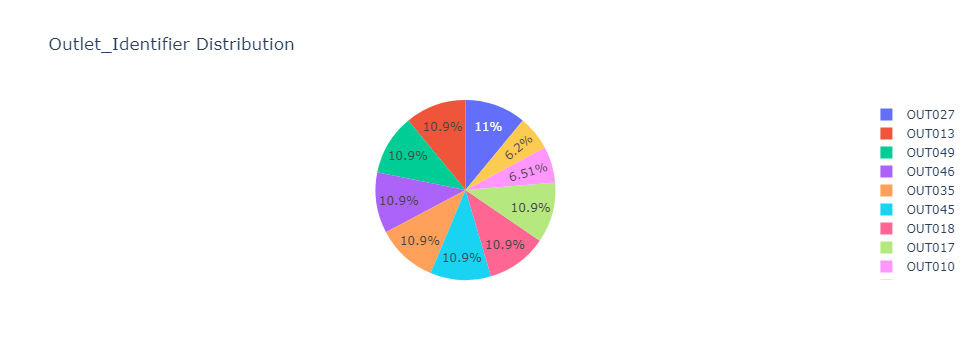

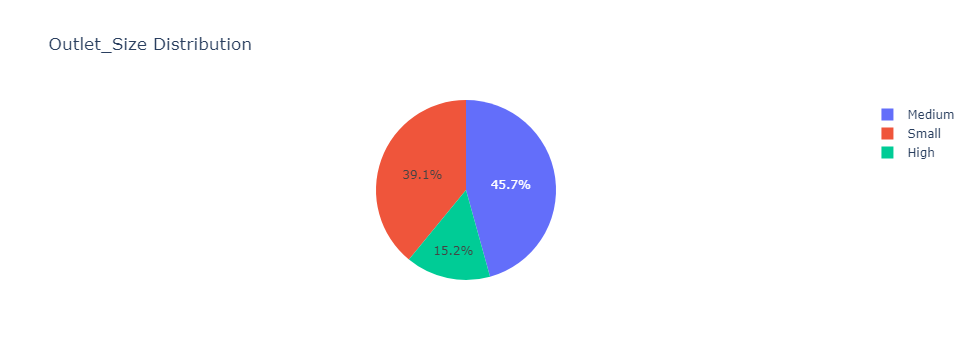

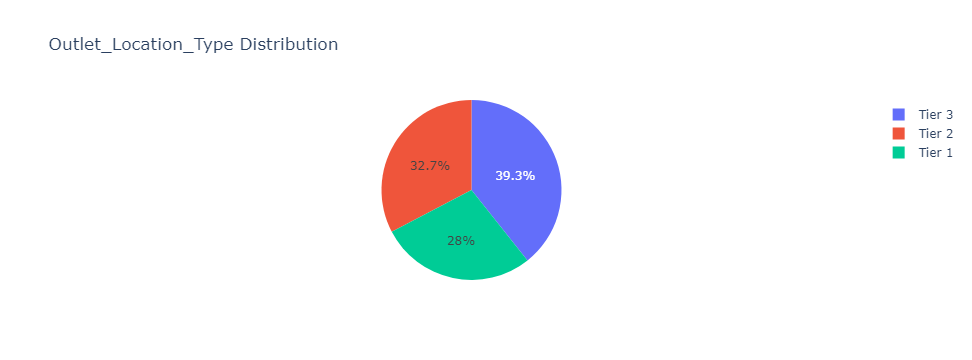

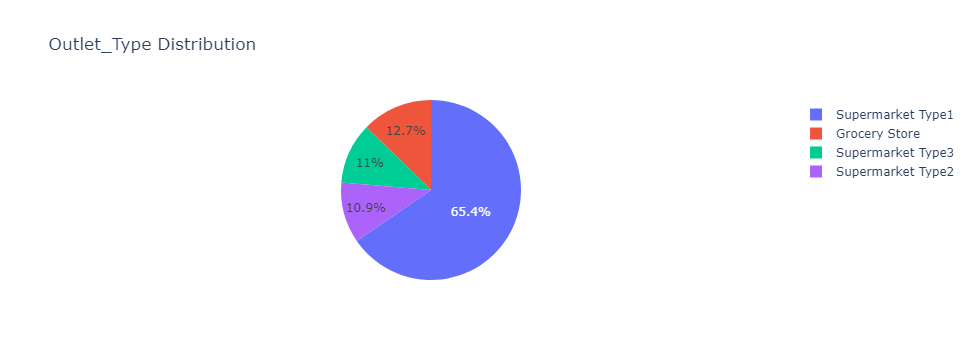

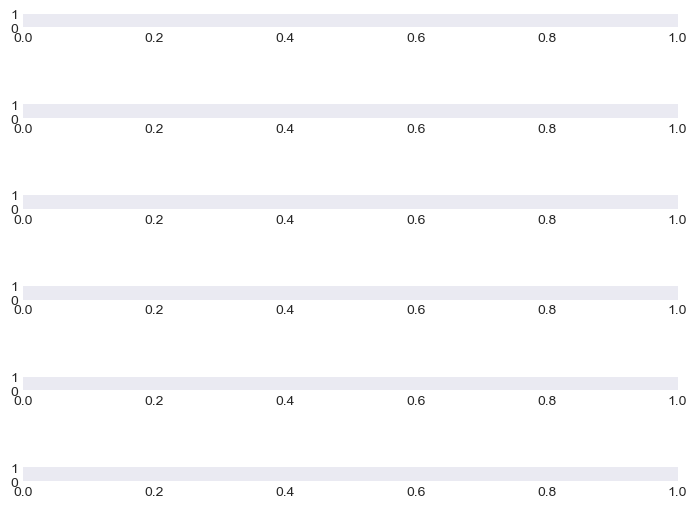

In [23]:
univariate_eda_pie_categorical(categorical)

## 2. Bivariate
- is a type of exploratory data analysis (EDA) that involves visualizing and analyzing the relationship between two variables in a dataset. It allows us to understand how two variables are related to each other and if there are any patterns, trends, or correlations between them.

In [24]:
def plot_numerical_vs_year(df):
    # Group the data by Outlet Establishment Year and calculate the mean of each numerical attribute
    grouped_data = df.groupby('Outlet_Establishment_Year').mean()
    numerical_attributes = ['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales']
    
    fig, axes = plt.subplots(len(numerical_attributes), 1, figsize=(10, 5 * len(numerical_attributes)))
    # Loop through each numerical attribute and create the line plot
    for i, attribute in enumerate(numerical_attributes):
        ax = axes[i]
        ax.plot(grouped_data.index, grouped_data[attribute], marker='o')
        ax.set_xlabel('Outlet Establishment Year')
        ax.set_ylabel(attribute)
        ax.set_title(f'Trend of {attribute} over the years')

    plt.tight_layout()
    plt.show()


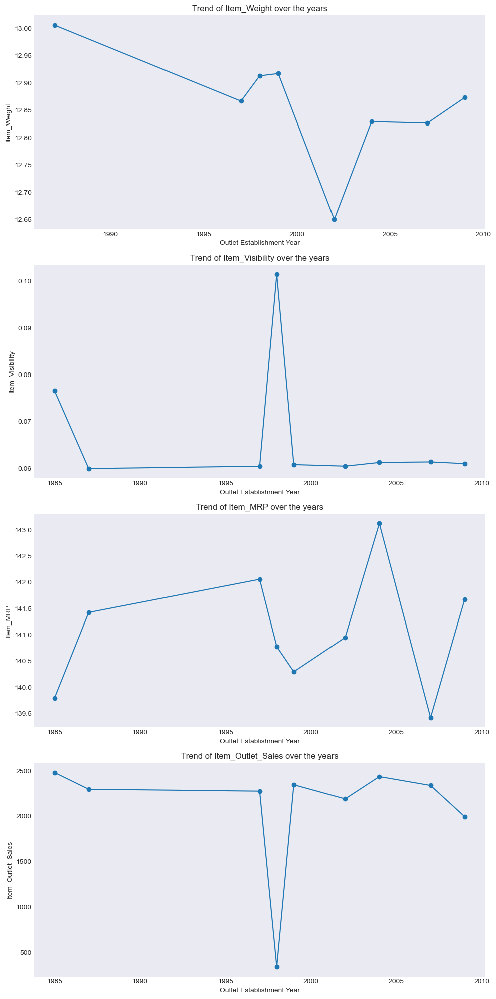

In [25]:
plot_numerical_vs_year(train)

In [26]:
def plot_categorical_vs_sales(df, categorical_attributes):
    num_rows = len(categorical_attributes)
    fig, axes = plt.subplots(num_rows, 1, figsize=(10, 6 * num_rows))
    plt.tight_layout(pad=4)

    # Loop through each categorical attribute and create the box plot
    for i, attribute in enumerate(categorical_attributes):
        ax = axes[i] if num_rows > 1 else axes

        # Box Plot
        df.boxplot(column='Item_Outlet_Sales', by=attribute, ax=ax)
        ax.set_title(f'Distribution of Item_Outlet_Sales by {attribute}')
        ax.set_xlabel(attribute)
        ax.set_ylabel('Item_Outlet_Sales')

    plt.show()

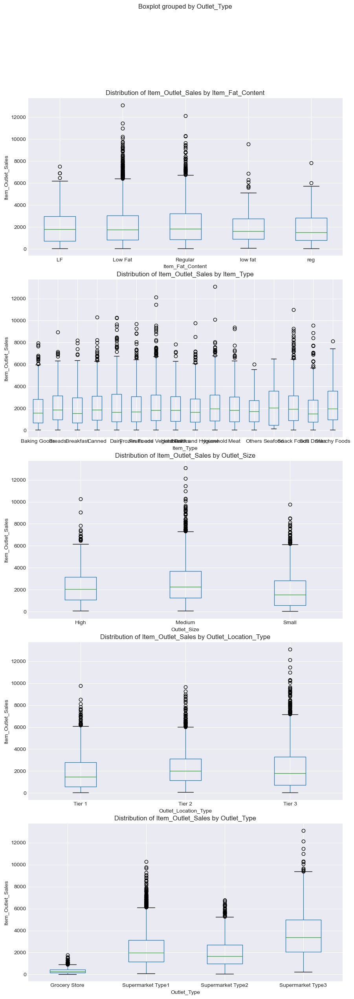

In [27]:
categorical_attributes = ['Item_Fat_Content', 'Item_Type', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type']
plot_categorical_vs_sales(train, categorical_attributes)

In [28]:
def plot_numerical_vs_sales(df):
    # Extract the relevant numerical attributes and Item_Outlet_Sales
    numerical_attributes = ['Item_Weight', 'Item_Visibility', 'Item_MRP']
    item_outlet_sales = df['Item_Outlet_Sales']

    num_rows, num_cols = 1, len(numerical_attributes)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(6 * num_cols, 5))
    plt.tight_layout(pad=4)
    for i, attribute in enumerate(numerical_attributes):
        ax = axes[i] if num_cols > 1 else axes

        # Scatter Plot
        ax.scatter(df[attribute], item_outlet_sales, alpha=0.5)
        ax.set_title(f'{attribute} vs. Item_Outlet_Sales')
        ax.set_xlabel(attribute)
        ax.set_ylabel('Item_Outlet_Sales')

    plt.show()

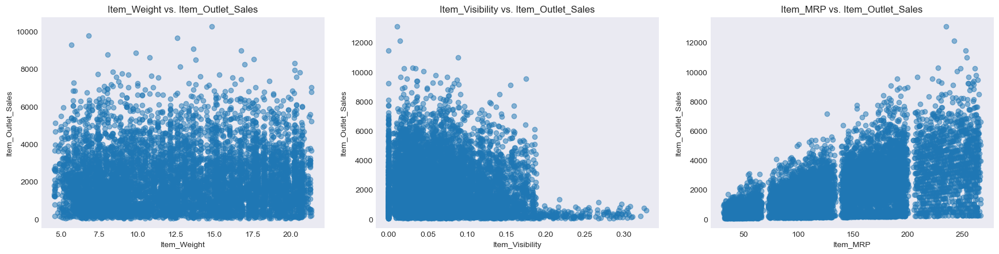

In [29]:
plot_numerical_vs_sales(train)

In [30]:
def plot_categorical_vs_sales(df):
    # Define the categorical attributes and their corresponding titles
    categorical_attributes = [
        'Outlet_Size',
        'Outlet_Location_Type',
        'Outlet_Type'
    ]
    titles = [
        'Outlet Size vs. Item_Outlet_Sales',
        'Outlet Location Type vs. Item_Outlet_Sales',
        'Outlet Type vs. Item_Outlet_Sales'
    ]
    
    num_rows, num_cols = 1, len(categorical_attributes)
    fig, axes = plt.subplots(num_cols, num_rows, figsize=(10, 12 ))
    plt.tight_layout(pad=4)

    # Loop through each categorical attribute and create the barh plot
    for i, attribute in enumerate(categorical_attributes):
        ax = axes[i] if num_cols > 1 else axes

        df.groupby(attribute)['Item_Outlet_Sales'].mean().plot(kind='barh', ax=ax, color='skyblue')
        ax.set_title(titles[i])
        ax.set_xlabel(attribute)
        ax.set_ylabel('Average Item_Outlet_Sales')

    plt.show()

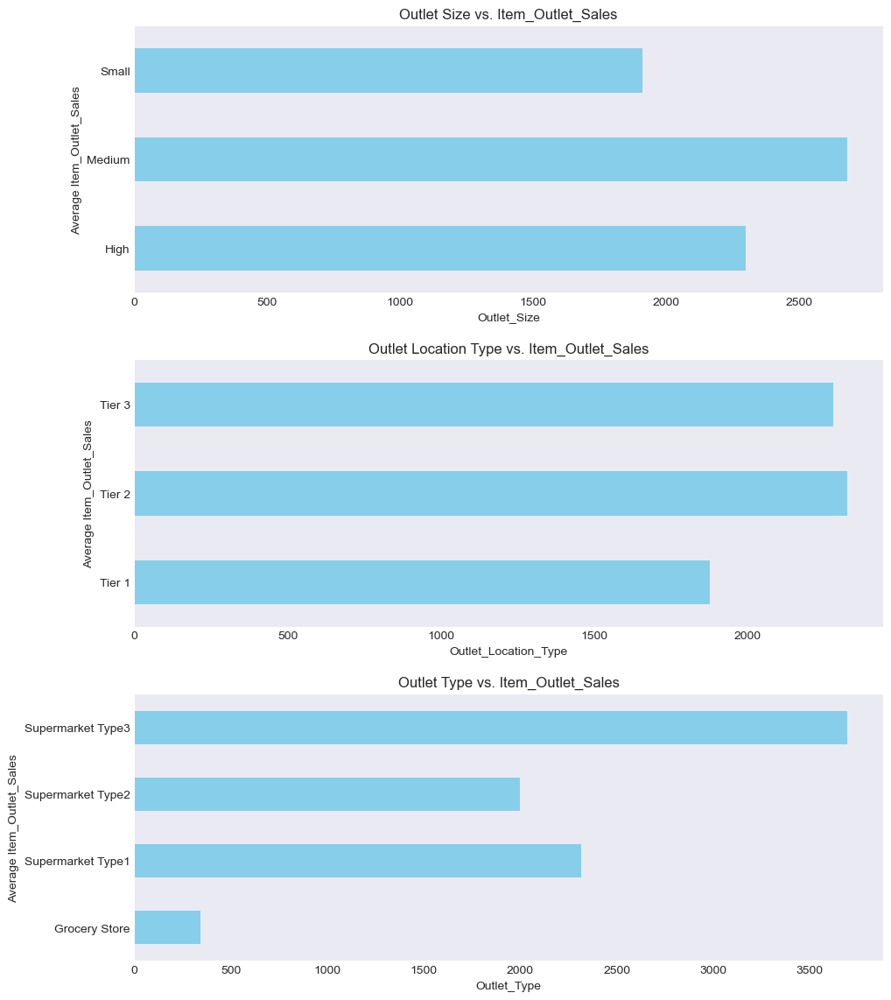

In [31]:
plot_categorical_vs_sales(train)

In [32]:
def plot_sales_distribution(df):
    sales_data = df['Item_Outlet_Sales']
    plt.figure(figsize=(10, 6))
    plt.hist(sales_data, bins=20, color='skyblue', edgecolor='black')
    plt.xlabel('Item_Outlet_Sales')
    plt.ylabel('Frequency')
    plt.title('Item_Outlet_Sales Distribution')
    plt.show()

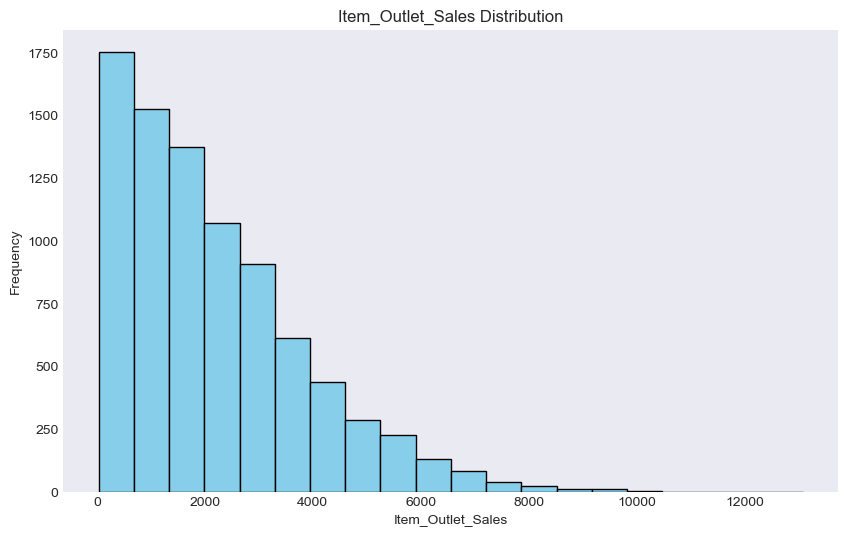

In [33]:
plot_sales_distribution(train)

In [34]:
def plot_correlation_heatmap(df):
    numerical_attributes = ['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales']
    numerical_data = df[numerical_attributes]
    correlation_matrix = numerical_data.corr()
    # Create the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title('Correlation Heatmap of Numerical Attributes')
    plt.show()

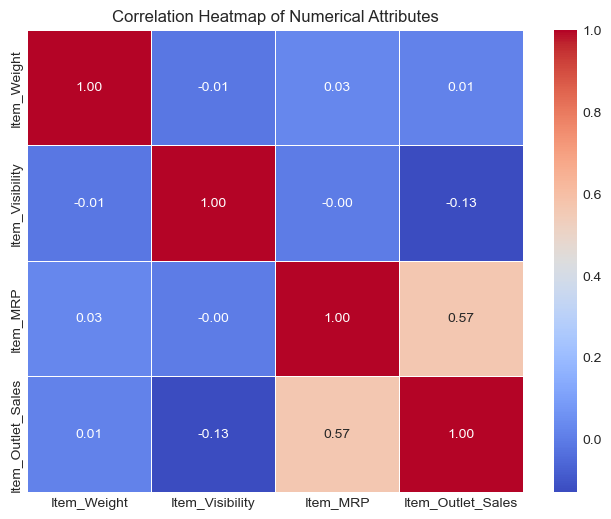

In [35]:
plot_correlation_heatmap(train)

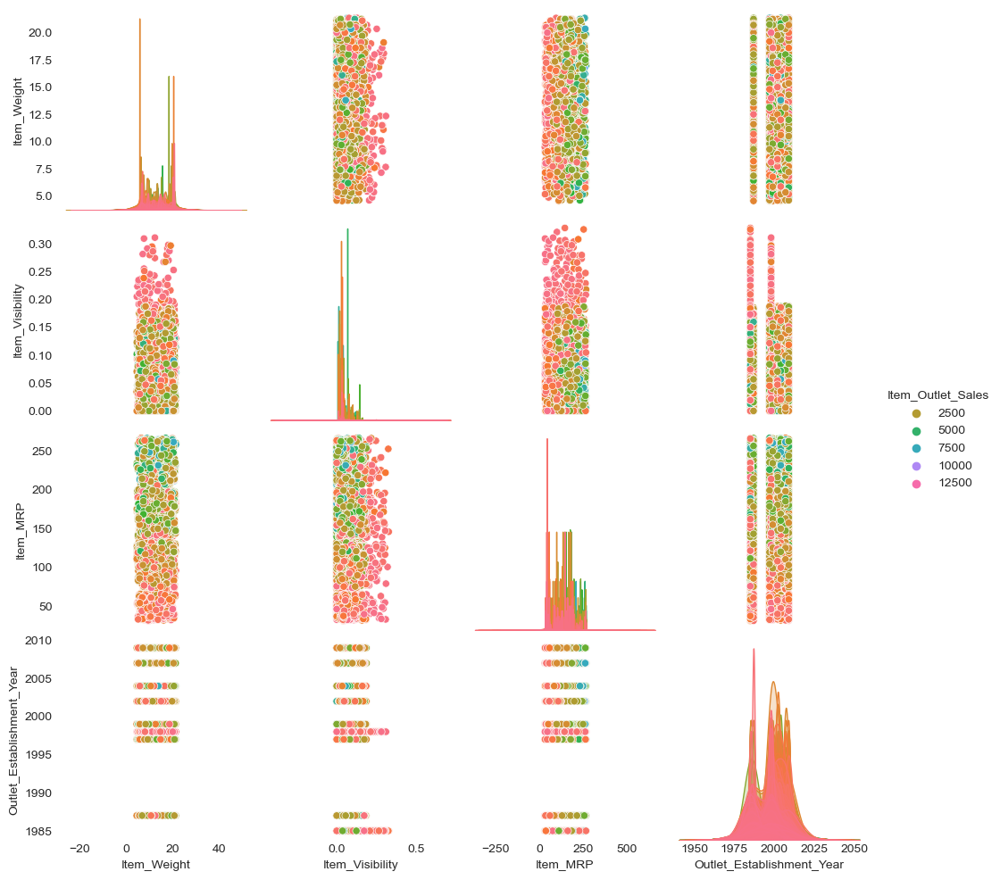

In [36]:
sns.set_style("ticks")
sns.pairplot(numerical,hue='Item_Outlet_Sales',diag_kind="kde",kind="scatter",palette="husl")

___

# 🙈 Missing Value Treatment

In [37]:
categorical.isna().sum()

Item_Identifier            0
Item_Fat_Content           0
Item_Type                  0
Outlet_Identifier          0
Outlet_Size             2410
Outlet_Location_Type       0
Outlet_Type                0
dtype: int64

In [38]:
categorical.Outlet_Size.value_counts()

Medium    2793
Small     2388
High       932
Name: Outlet_Size, dtype: int64

In [39]:
def total_missing_value(df):
    missing_values_count = df.isnull().sum()
    
    # how many total missing values do we have?
    total_cells = np.product(df.shape)
    total_missing = missing_values_count.sum()
    percent_missing = (total_missing/total_cells) * 100
    return (percent_missing)

In [40]:
print(f'Total missing values in categoric train data are: {total_missing_value(categorical)}')

Total missing values in categoric train data are: 4.039489783945961


In [41]:
print(f'Total missing values in numeric test data are: {total_missing_value(numerical)}')

Total missing values in numeric test data are: 3.4330634753021236


In [42]:
print(f'Total missing values in the train dataset are: {total_missing_value(train)}')

Total missing values in the train dataset are: 3.786812155344362


In [43]:
print(f'Total missing values in the test dataset are: {total_missing_value(test)}')

Total missing values in the test dataset are: 4.131794978476901


### Dealing with Outlet_Size column

#### before filling tha null's

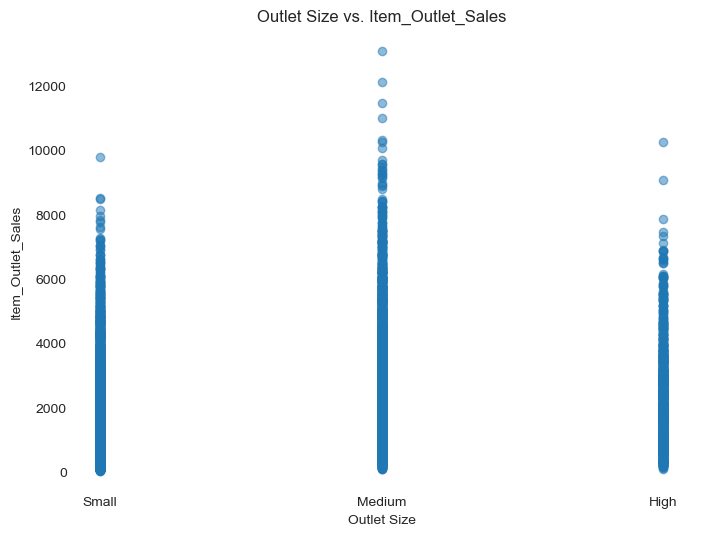

In [44]:
# Encode 'Outlet_Size' into numerical values
outlet_size_mapping = {'Small': 0, 'Medium': 1, 'High': 2}
train['Outlet_Size_Encoded'] = train['Outlet_Size'].map(outlet_size_mapping)

# scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(train['Outlet_Size_Encoded'], train['Item_Outlet_Sales'], alpha=0.5)
plt.xticks([0, 1, 2], ['Small', 'Medium', 'High'])
plt.xlabel('Outlet Size')
plt.ylabel('Item_Outlet_Sales')
plt.title('Outlet Size vs. Item_Outlet_Sales')
plt.show()


In [45]:
train.drop('Outlet_Size_Encoded', axis=1, inplace=True)

#### after filling tha null's

In [46]:
# Function to fill null values based on weights
def fill_null_with_weights(row):
    
    # Calculate the frequency (proportion) of each category in the 'Outlet_Size' column
    outlet_size_weights = categorical['Outlet_Size'].value_counts(normalize=True)
    
    if pd.isnull(row['Outlet_Size']):
        return np.random.choice(outlet_size_weights.index, p=outlet_size_weights.values)
    return row['Outlet_Size']

In [47]:
# Apply the function to fill null values in the 'Outlet_Size' column
categorical['Outlet_Size'] = categorical.apply(lambda row: fill_null_with_weights(row), axis=1)

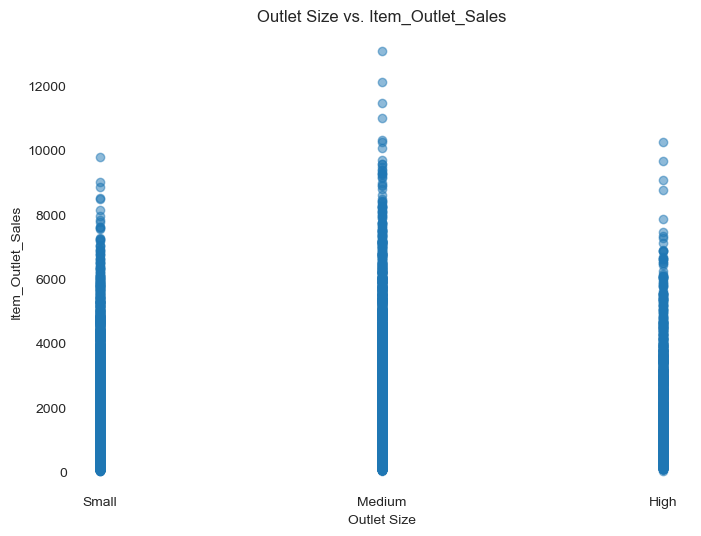

In [48]:
# Encode 'Outlet_Size' into numerical values
outlet_size_mapping = {'Small': 0, 'Medium': 1, 'High': 2}
categorical['Outlet_Size_Encoded'] = categorical['Outlet_Size'].map(outlet_size_mapping)

# scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(categorical['Outlet_Size_Encoded'], train['Item_Outlet_Sales'], alpha=0.5)
plt.xticks([0, 1, 2], ['Small', 'Medium', 'High'])
plt.xlabel('Outlet Size')
plt.ylabel('Item_Outlet_Sales')
plt.title('Outlet Size vs. Item_Outlet_Sales')
plt.show()

In [49]:
categorical.Outlet_Size.value_counts()

Medium    3922
Small     3331
High      1270
Name: Outlet_Size, dtype: int64

In [50]:
categorical.isna().sum()

Item_Identifier         0
Item_Fat_Content        0
Item_Type               0
Outlet_Identifier       0
Outlet_Size             0
Outlet_Location_Type    0
Outlet_Type             0
Outlet_Size_Encoded     0
dtype: int64

### Dealing with Item_Weight column

In [51]:
numerical.isna().sum()

Item_Weight                  1463
Item_Visibility                 0
Item_MRP                        0
Outlet_Establishment_Year       0
Item_Outlet_Sales               0
dtype: int64

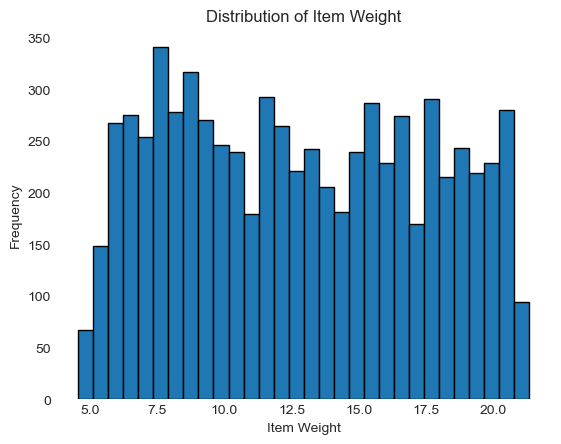

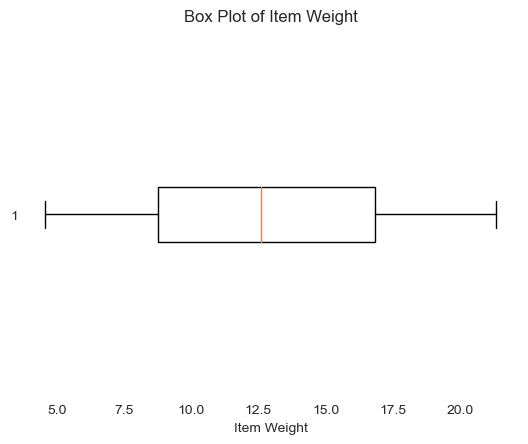

In [52]:
# Histogram
plt.hist(numerical['Item_Weight'].dropna(), bins=30, edgecolor='black')
plt.xlabel('Item Weight')
plt.ylabel('Frequency')
plt.title('Distribution of Item Weight')
plt.show()

# Box Plot
plt.boxplot(numerical['Item_Weight'].dropna(), vert=False)
plt.xlabel('Item Weight')
plt.title('Box Plot of Item Weight')
plt.show()

In [53]:
numerical['Item_Weight'].describe()

count    7060.000000
mean       12.857645
std         4.643456
min         4.555000
25%         8.773750
50%        12.600000
75%        16.850000
max        21.350000
Name: Item_Weight, dtype: float64

In [54]:
def fill_numerical_null(df):
    imputer = SimpleImputer(strategy='median')
    # Reshape the 'Item_Weight' column to be a 2D array for imputation
    item_weight_values = df['Item_Weight'].values.reshape(-1, 1)
    df['Item_Weight'] = imputer.fit_transform(item_weight_values)
    
fill_numerical_null(numerical)

In [55]:
numerical['Item_Weight'].describe()

count    8523.00000
mean       12.81342
std         4.22724
min         4.55500
25%         9.31000
50%        12.60000
75%        16.00000
max        21.35000
Name: Item_Weight, dtype: float64

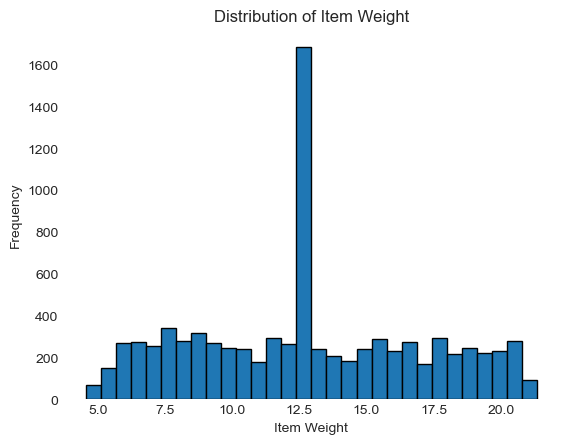

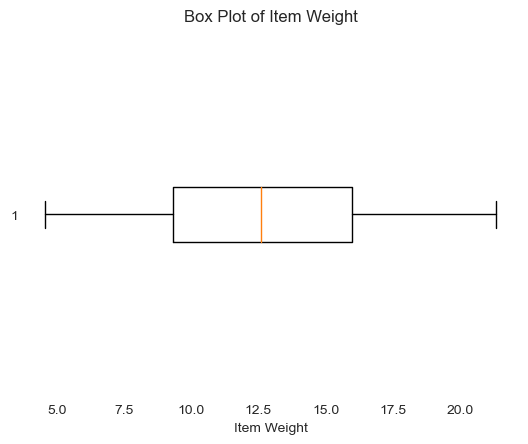

In [56]:
# Histogram
plt.hist(numerical['Item_Weight'].dropna(), bins=30, edgecolor='black')
plt.xlabel('Item Weight')
plt.ylabel('Frequency')
plt.title('Distribution of Item Weight')
plt.show()

# Box Plot
plt.boxplot(numerical['Item_Weight'].dropna(), vert=False)
plt.xlabel('Item Weight')
plt.title('Box Plot of Item Weight')
plt.show()

In [57]:
numerical.isna().sum()

Item_Weight                  0
Item_Visibility              0
Item_MRP                     0
Outlet_Establishment_Year    0
Item_Outlet_Sales            0
dtype: int64

____________________

# 🎨 Feature Engineering

### 1. separate the target from the features

In [58]:
X, y = train.drop('Item_Outlet_Sales', axis=1), train['Item_Outlet_Sales']

In [59]:
X

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1
...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2


In [60]:
y

0       3735.1380
1        443.4228
2       2097.2700
3        732.3800
4        994.7052
          ...    
8518    2778.3834
8519     549.2850
8520    1193.1136
8521    1845.5976
8522     765.6700
Name: Item_Outlet_Sales, Length: 8523, dtype: float64

In [61]:
# display the values for each column
def count_values(df):
    result = [df[col].value_counts() for col in df.columns]
    return result

In [62]:
result = count_values(categorical)
for i in range(len(result)):
    print(result[i])
    print('**************************************************')


FDW13    10
FDG33    10
NCY18     9
FDD38     9
DRE49     9
         ..
FDY43     1
FDQ60     1
FDO33     1
DRF48     1
FDC23     1
Name: Item_Identifier, Length: 1559, dtype: int64
**************************************************
Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64
**************************************************
Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64
**************************************************
OUT027    935
OUT013    932
OUT049    

### 2. fill missing value

In [63]:
# fill Outlet_Size column
X['Outlet_Size'] = X.apply(lambda row: fill_null_with_weights(row), axis=1)

In [64]:
# fill Item_Weight column
fill_numerical_null(X)

In [65]:
X.isna().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
dtype: int64

### 3. Variable transformation

In [66]:
def plots(df, column, title):
    plt.figure(figsize=(15, 6))
    
    # Histogram
    plt.subplot(1, 2, 1)
    sns.kdeplot(df[column], fill=True)
    plt.title(f"{column} Distribution")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    
    # Probability plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[column].values, dist="norm", plot=pylab)
    plt.title(f"{title} Probability Plot")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    
    plt.show()

In [67]:
# Define the list of transformers
transformers = ['log1p', 'exp', 'sqrt']

def plot_transformations(df, column):
    
    for transformer in transformers:
        if transformer == 'log1p':
            transformed_column = np.log1p(df[column])
            title = f'Log1p Transformation of {column}'
        elif transformer == 'exp':
            transformed_column = np.exp(df[column])
            title = f'Exponential Transformation of {column}'
        elif transformer == 'sqrt':
            transformed_column = np.sqrt(df[column])
            title = f'Square Root Transformation of {column}'
        else:
            raise ValueError(
                "Invalid transformer. Supported transformers are 'log1p', 'exp', and 'sqrt'."
            )

        # Plot the transformation
        plots(pd.DataFrame({column: transformed_column}), column=column, title=title) # built-in function

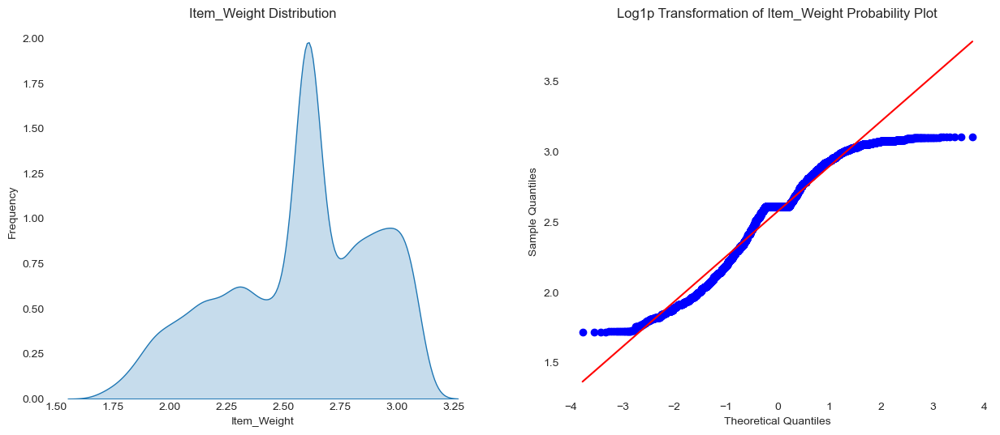

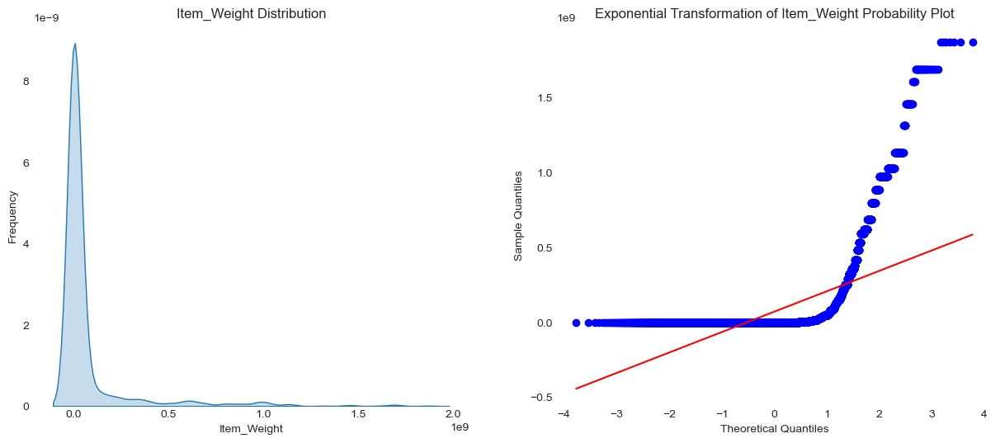

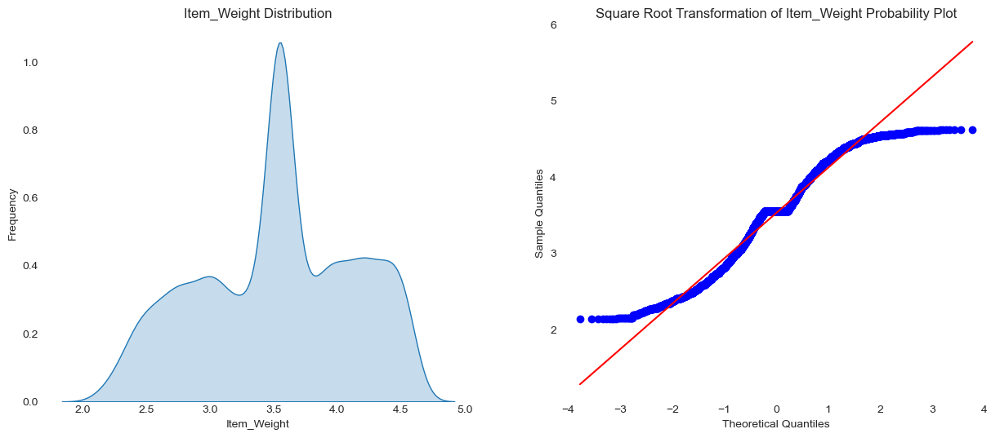

In [68]:
plot_transformations(X, 'Item_Weight')

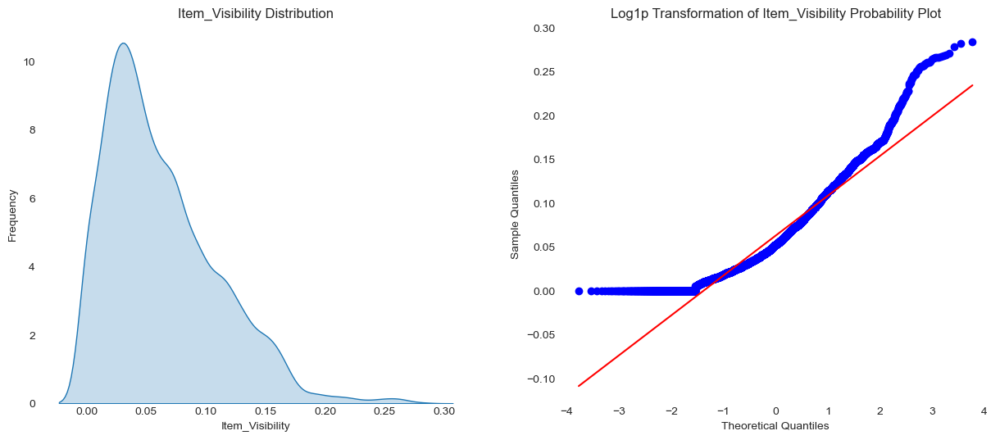

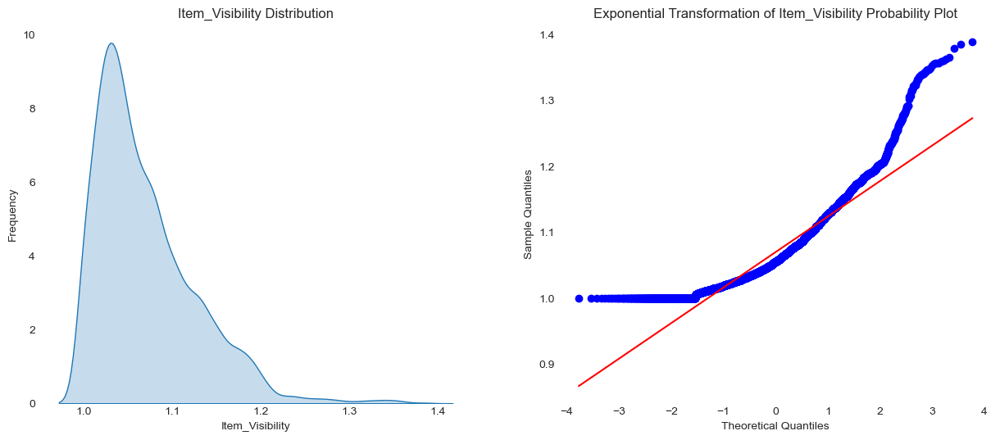

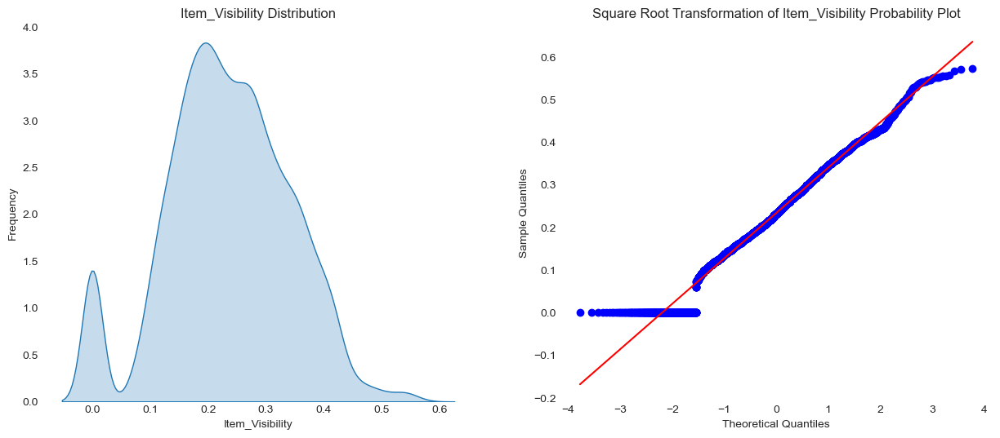

In [69]:
plot_transformations(X, 'Item_Visibility')

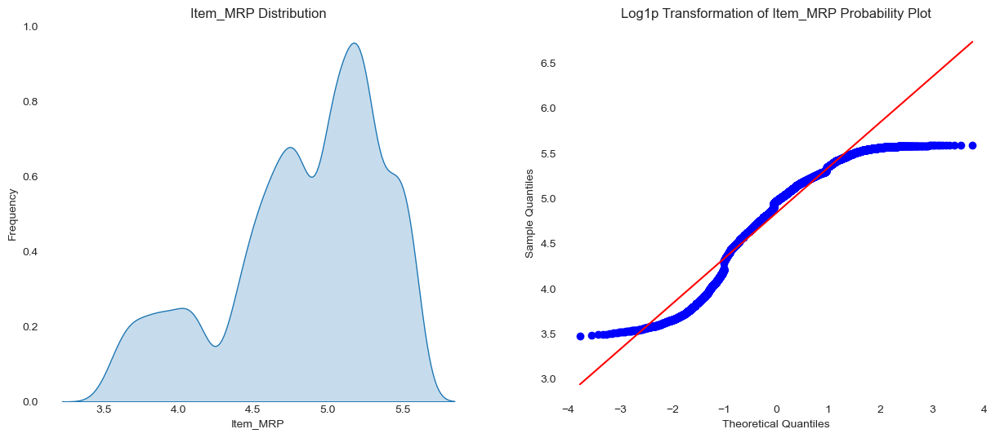

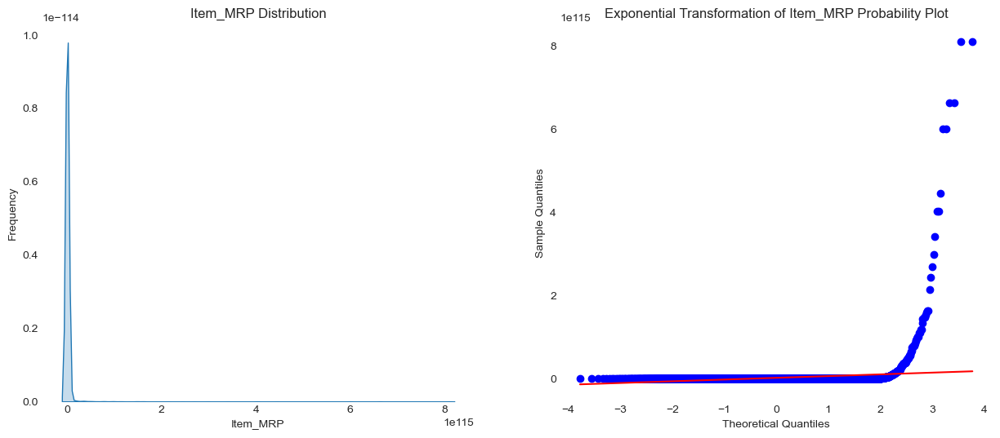

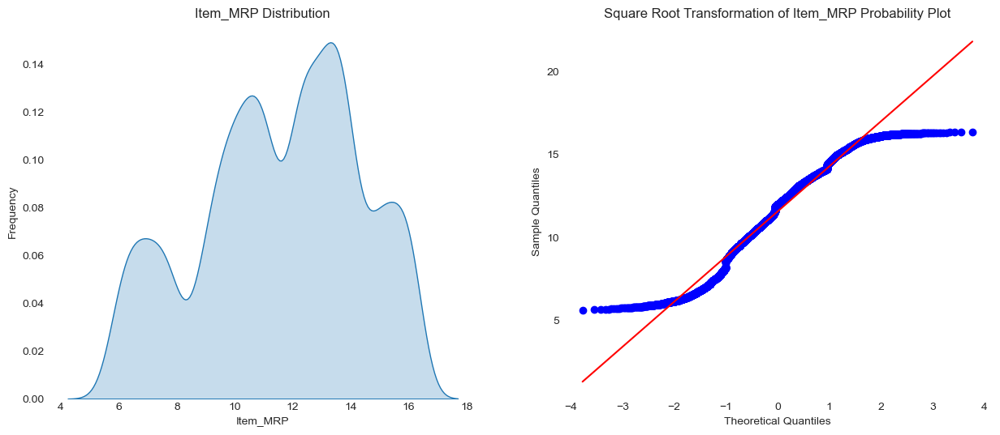

In [70]:
plot_transformations(X, 'Item_MRP')

- The `Square Root` Transformation is the best for `Item_Weight`
- The `Square Root` Transformation is the best for `Item_Visibility`
- The `Square Root` Transformation is the best for `Item_MRP`

In [71]:

def apply_square_root_transformation(df, columns):
    for column in columns:
        if column in df.columns:
            df[column] = np.sqrt(df[column])
            
columns_to_transform = ['Item_Weight', 'Item_Visibility', 'Item_MRP']

# Apply the square root transformation
apply_square_root_transformation(X, columns_to_transform)

In [72]:
X

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDA15,3.049590,Low Fat,0.126678,Dairy,15.805354,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,DRC01,2.433105,Regular,0.138846,Soft Drinks,6.947604,OUT018,2009,Medium,Tier 3,Supermarket Type2
2,FDN15,4.183300,Low Fat,0.129461,Meat,11.900336,OUT049,1999,Medium,Tier 1,Supermarket Type1
3,FDX07,4.381780,Regular,0.000000,Fruits and Vegetables,13.494258,OUT010,1998,Medium,Tier 3,Grocery Store
4,NCD19,2.988311,Low Fat,0.000000,Household,7.339033,OUT013,1987,High,Tier 3,Supermarket Type1
...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,2.620115,Low Fat,0.238293,Snack Foods,14.646563,OUT013,1987,High,Tier 3,Supermarket Type1
8519,FDS36,2.894823,Regular,0.216754,Baking Goods,10.399856,OUT045,2002,High,Tier 2,Supermarket Type1
8520,NCJ29,3.255764,Low Fat,0.187580,Health and Hygiene,9.226180,OUT035,2004,Small,Tier 2,Supermarket Type1
8521,FDN46,2.685144,Regular,0.381078,Snack Foods,10.155452,OUT018,2009,Medium,Tier 3,Supermarket Type2


### 4. Outlier detection

In [73]:
numerical.columns

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP',
       'Outlet_Establishment_Year', 'Item_Outlet_Sales'],
      dtype='object')

In [74]:
def plot_boxplot_outliers(df, columns):
    for column in columns:
        if column in df.columns:
            fig = px.box(df, y=column, title=f"Box Plot of {column} with Outliers")
            fig.show()

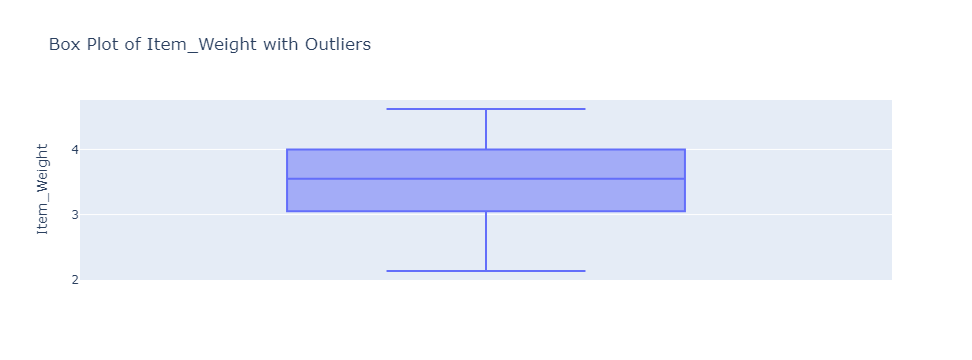

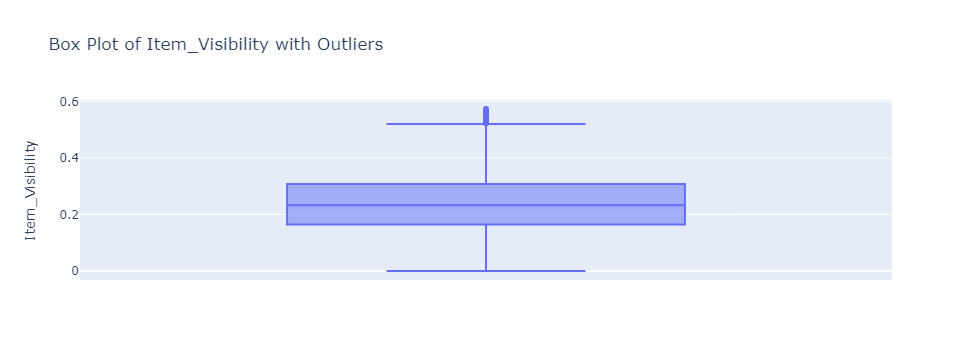

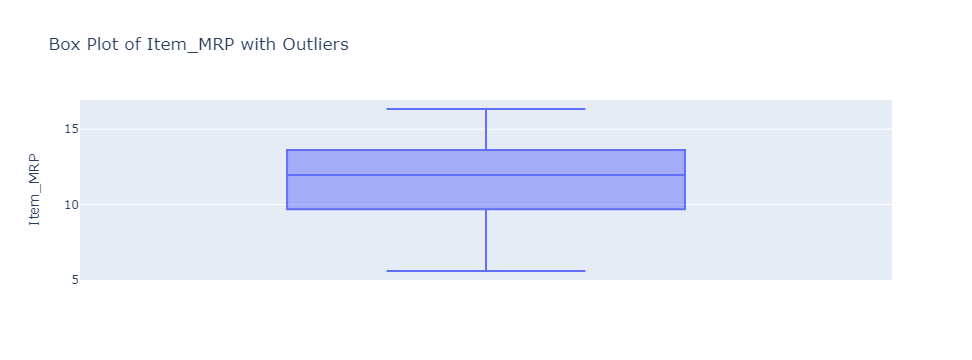

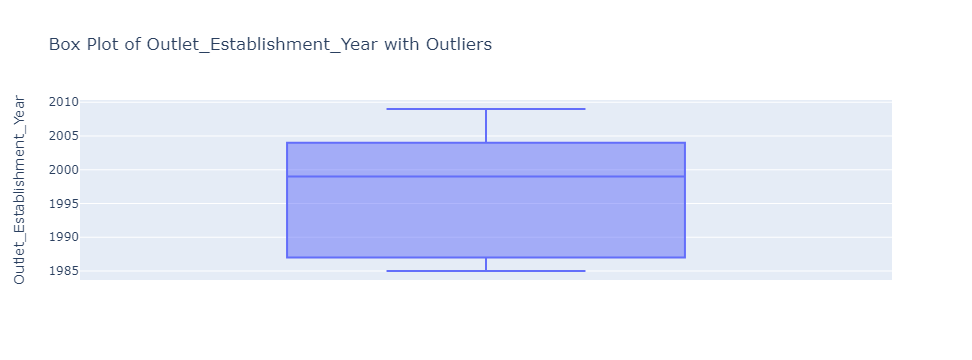

In [75]:
columns_to_check_outliers = ['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Outlet_Establishment_Year']
plot_boxplot_outliers(X, columns_to_check_outliers)

- the only column with outliers is Item_Visibility and we should deal with it

In [76]:
def handle_outliers_above_upper_fence(df, column, upper_fence):
    df[column] = df[column].apply(lambda x: upper_fence if x > upper_fence else x)
    return df

upper_fence_Item_Visibility = 0.5199
X = handle_outliers_above_upper_fence(X, 'Item_Visibility', upper_fence_Item_Visibility)

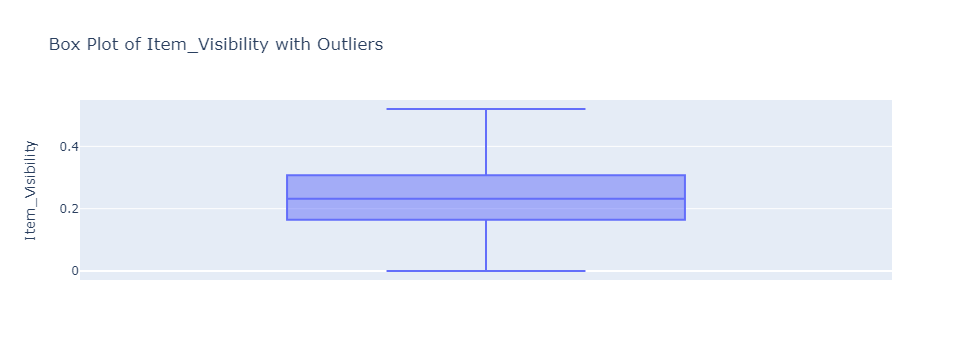

In [77]:
plot_boxplot_outliers(X, ['Item_Visibility'])

### 5. dealing with categorical

In [78]:
def count_values(df):
    result = [df[col].value_counts() for col in df.columns]
    return result

In [79]:
result = count_values(categorical)
for i in range(len(result)):
    print(result[i])
    print('**************************************************')

FDW13    10
FDG33    10
NCY18     9
FDD38     9
DRE49     9
         ..
FDY43     1
FDQ60     1
FDO33     1
DRF48     1
FDC23     1
Name: Item_Identifier, Length: 1559, dtype: int64
**************************************************
Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64
**************************************************
Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64
**************************************************
OUT027    935
OUT013    932
OUT049    

- I will use **label encoder** for this columns `Item_Identifier` `Item_Fat_Content` `Item_Type` `Outlet_Identifier` `Outlet_Size` 
- and will use **One hot encoder** for `Outlet_Location_Type` `Outlet_Type`

In [80]:
def encode_data(df):
    label_encode_cols = [
        'Item_Identifier',
        'Item_Fat_Content',
        'Item_Type',
        'Outlet_Identifier',
        'Outlet_Size'
    ]
    onehot_encode_cols = [
        'Outlet_Location_Type',
        'Outlet_Type'
    ]
    label_encoder = LabelEncoder()
    onehot_encoder = OneHotEncoder()

    # Label encoding
    for col in label_encode_cols:
        df[col] = label_encoder.fit_transform(df[col])

    # One-hot encoding
    onehot_encoded_cols = pd.DataFrame(
        onehot_encoder.fit_transform(
            df[onehot_encode_cols]
        ).toarray(),
        columns=onehot_encoder.get_feature_names_out(
            onehot_encode_cols
        )
    )
    df = pd.concat([df, onehot_encoded_cols], axis=1)
    df.drop(columns=onehot_encode_cols, inplace=True)

    return df

In [81]:
X = encode_data(X)

In [82]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Item_Identifier                8523 non-null   int32  
 1   Item_Weight                    8523 non-null   float64
 2   Item_Fat_Content               8523 non-null   int32  
 3   Item_Visibility                8523 non-null   float64
 4   Item_Type                      8523 non-null   int32  
 5   Item_MRP                       8523 non-null   float64
 6   Outlet_Identifier              8523 non-null   int32  
 7   Outlet_Establishment_Year      8523 non-null   int64  
 8   Outlet_Size                    8523 non-null   int32  
 9   Outlet_Location_Type_Tier 1    8523 non-null   float64
 10  Outlet_Location_Type_Tier 2    8523 non-null   float64
 11  Outlet_Location_Type_Tier 3    8523 non-null   float64
 12  Outlet_Type_Grocery Store      8523 non-null   f

In [83]:
X

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,156,3.049590,1,0.126678,4,15.805354,9,1999,1,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,8,2.433105,2,0.138846,14,6.947604,3,2009,1,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,662,4.183300,1,0.129461,10,11.900336,9,1999,1,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1121,4.381780,2,0.000000,6,13.494258,0,1998,1,0.0,0.0,1.0,1.0,0.0,0.0,0.0
4,1297,2.988311,1,0.000000,9,7.339033,1,1987,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8518,370,2.620115,1,0.238293,13,14.646563,1,1987,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
8519,897,2.894823,2,0.216754,0,10.399856,7,2002,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
8520,1357,3.255764,1,0.187580,8,9.226180,6,2004,2,0.0,1.0,0.0,0.0,1.0,0.0,0.0
8521,681,2.685144,2,0.381078,13,10.155452,3,2009,1,0.0,0.0,1.0,0.0,0.0,1.0,0.0


### 6. Scaling data

In [84]:
def scale_data(df):
    scaler = StandardScaler()
    df = scaler.fit_transform(df)
    return df

In [85]:
features = scale_data(X)

In [86]:
features[0], y[0]

(array([-1.38851383, -0.78958865, -0.57284357, -0.999327  , -0.76647929,
         1.53870577,  1.50781338,  0.13954076, -0.34391321,  1.60283982,
        -0.69667837, -0.8047318 , -0.38152918,  0.72680189, -0.34955064,
        -0.35102831]),
 3735.138)

### 7.Preprocessing

- *Before we go to deeper, we will make an estimator for functions to use Pipelines and fit transformation in our test data easy.*
    - there is two way to do this 
        - building custom transformers
        - using FunctionTransformer from sklearn

#### First way building custom transformers

In [87]:
# custom fill na transformers depending on the previous functions called `fill_null_with_weights` `fill_numerical_null`
class CustomFillNullTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, data):
        self.data = data
        
    def fill_null_with_weights(self, row):
        outlet_size_weights = self.data['Outlet_Size'].value_counts(normalize=True)
        if pd.isnull(row['Outlet_Size']):
            return np.random.choice(outlet_size_weights.index, p=outlet_size_weights.values)
        return row['Outlet_Size']

    def fill_numerical_null(self, df):
        imputer = SimpleImputer(strategy='median')
        item_weight_values = df['Item_Weight'].values.reshape(-1, 1)
        df['Item_Weight'] = imputer.fit_transform(item_weight_values)
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_copy = X.copy()
        X_copy['Outlet_Size'] = X_copy.apply(self.fill_null_with_weights, axis=1)
        self.fill_numerical_null(X_copy)
        return X_copy


In [88]:
# custom Square-Root transformers depending on the previous function called `apply_square_root_transformation`
class SquareRootTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        
    def apply_square_root_transformation(self, df):
        for column in self.columns:
            if column in df.columns:
                df[column] = np.sqrt(df[column])
        return df
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_copy = X.copy()
        return self.apply_square_root_transformation(X_copy)

In [89]:
# custom Outlier Handler transformers depending on the previous function called `handle_outliers_above_upper_fence`
class OutlierHandlerTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, column, upper_fence):
        self.column = column
        self.upper_fence = upper_fence
        
    def handle_outliers_above_upper_fence(self, df):
        df[self.column] = df[self.column].apply(lambda x: self.upper_fence if x > self.upper_fence else x)
        return df
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_copy = X.copy()
        return self.handle_outliers_above_upper_fence(X_copy)

#### Second way build Transformers using FunctionTransformer from sk-learn

In [90]:
# Define the instance custom transformer
encode_transformer = FunctionTransformer(encode_data)

In [91]:
scaler = StandardScaler()

- Build Pipeline for all transformations
    - 1st step - Fill null values, transformer instance
    - 2nd step - Square root transformation, transformer instance
    - 3rd step - Outlier handling transformation, transformer instance
    - 4th step - Encode categorical columns
    - 5th step - Scaling data 

In [92]:
# 1st step - Fill null values, transformer instance
fill_null_transformer = CustomFillNullTransformer(test)

# 2nd step - Square root transformation, transformer instance
columns_to_transform = ['Item_Weight', 'Item_Visibility', 'Item_MRP']
sqrt_transformer = SquareRootTransformer(columns=columns_to_transform)

# 3rd step - Outlier handling transformation, transformer instance
outlier_handler = OutlierHandlerTransformer(column='Item_Visibility', upper_fence=0.5199)

# 4th step - Encode categorical columns
encode_transformer = FunctionTransformer(encode_data)

# 5th step - Scaling data 
scaler = StandardScaler()

In [93]:
# Build the pipeline for numerical columns
preprocessor = Pipeline([
    ('fill_null', fill_null_transformer),
    ('sqrt_transform', sqrt_transformer),
    ('outlier_handler', outlier_handler),
    ('encode', encode_transformer),
    ('scaler', scaler)
])

### 8. Prepare data for models

In [94]:
X, y = train.drop('Item_Outlet_Sales', axis=1), train['Item_Outlet_Sales']

In [95]:
features = preprocessor.fit_transform(X)

# 🤖 Modeling

## Linear Regression & Ridge

### 1. Split data and make baseline

In [96]:
# Shuffle and split the data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(features, y, test_size=0.2, random_state=42, shuffle=True)

# Initialize the linear regression base model
lr_baseLine = LinearRegression()
lr_baseLine.fit(X_train, y_train)
score = lr_baseLine.score(X_val, y_val)
# Print the R-squared score as the baseline performance metric
print(f"R-squared score (baseline): {score:.4f}")

R-squared score (baseline): 0.5724


In [97]:
# Print the Root-mean squared error
y_prediction = lr_baseLine.predict(X_val)
mse = mean_squared_error(y_prediction, y_val)
rmse = np.sqrt(mse)
print(f"Root mean squared error: {rmse}")

Root mean squared error: 1078.0366300419118


### 2. Display the baseline performance

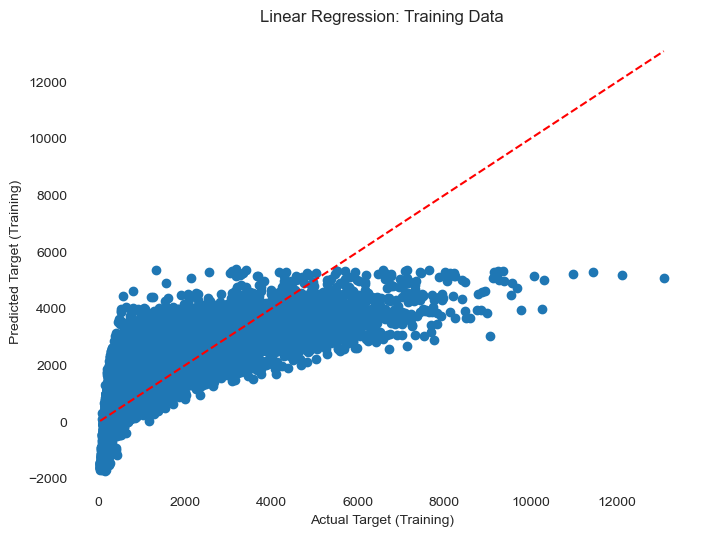

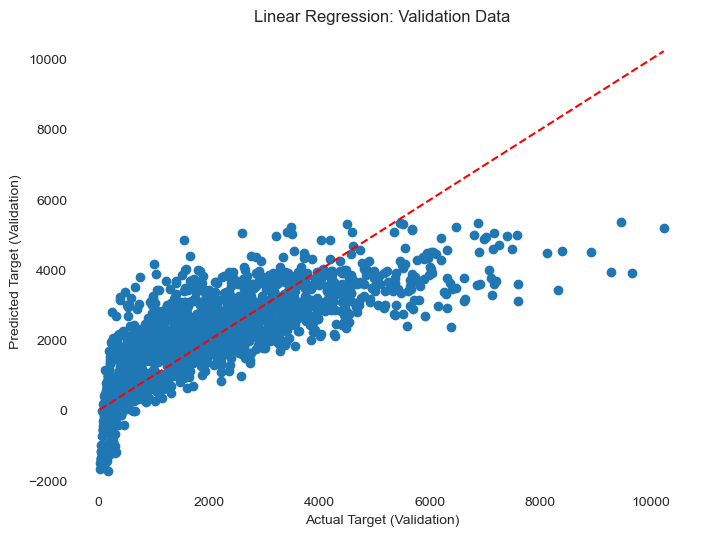

In [98]:
def display_train_val_plots(model, X_train, X_val, y_train, y_val):
    # Predict the target values for training and validation sets
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)

    # Scatter plot for training data
    plt.figure(figsize=(8, 6))
    plt.scatter(y_train, y_train_pred)
    plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r--')
    plt.xlabel("Actual Target (Training)")
    plt.ylabel("Predicted Target (Training)")
    plt.title("Linear Regression: Training Data")
    plt.show()

    # Scatter plot for validation data
    plt.figure(figsize=(8, 6))
    plt.scatter(y_val, y_val_pred)
    plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], 'r--')
    plt.xlabel("Actual Target (Validation)")
    plt.ylabel("Predicted Target (Validation)")
    plt.title("Linear Regression: Validation Data")
    plt.show()
    
display_train_val_plots(lr_baseLine, X_train, X_val, y_train, y_val)

### 3. Search for the best fit line & Regularized the model

In [99]:
def create_pipeline_and_fit(X_train, y_train):

    # Create a pipeline
    pipe = Pipeline([
        ('poly', PolynomialFeatures(degree=3)),
        ('ridge', Ridge())
    ])

    param_grid = {
        'ridge__alpha': [0.1, 1.0, 10.0],
        'ridge__tol': [10.0, 1.0, 0.1, 0.01],
        'poly__degree': [1, 2, 3, 4]
    }

    # Perform grid search with cross-validation
    grid_search = GridSearchCV(pipe, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
    grid_search.fit(X_train, y_train)

    return grid_search

In [100]:
grid_search = create_pipeline_and_fit(features, y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


In [101]:
best_model = grid_search.best_estimator_ # Get the best model

# Predict the target values for training and validation
y_train_pred = best_model.predict(X_train)
y_val_pred = best_model.predict(X_val)

# Calculate Mean Squared Error (MSE) for training and validation sets
mse_train = mean_squared_error(y_train, y_train_pred)
mse_val = mean_squared_error(y_val, y_val_pred)
r2_train = r2_score(y_train, y_train_pred)
r2_val = r2_score(y_val, y_val_pred)

# **************************************************************************************
# Print the MSE and best hyperparameters                                              #*
print(f"Root-Mean Squared Error (RMSE) for training set: {np.sqrt(mse_train):.4f}")   #*
print(f"Root-Mean Squared Error (RMSE) for validation set: {np.sqrt(mse_val):.4f}")   #*
print(f"R-squared (R2) for training set: {r2_train}")                                 #*
print(f"R-squared (R2) for validation set: {r2_val}")                                 #*
# Print the R-squared score as the baseline performance metric                        #*
score = best_model.score(X_val, y_val)                                                #*
print(f"R-squared score (best_model): {score:.4f}")                                   #*
print("Best hyperparameters:")                                                        #*
print(grid_search.best_params_)                                                       #*
# **************************************************************************************

Root-Mean Squared Error (RMSE) for training set: 1081.1566
Root-Mean Squared Error (RMSE) for validation set: 1008.9161
R-squared (R2) for training set: 0.6048412035693802
R-squared (R2) for validation set: 0.6254882449366035
R-squared score (best_model): 0.6255
Best hyperparameters:
{'poly__degree': 2, 'ridge__alpha': 10.0, 'ridge__tol': 10.0}


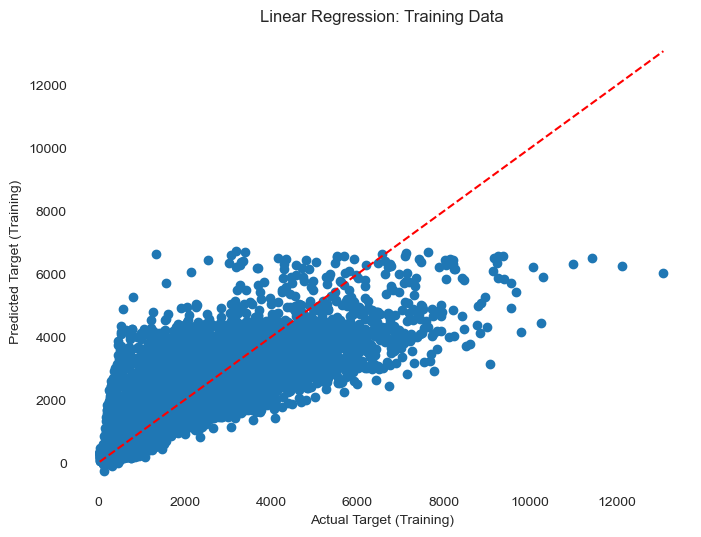

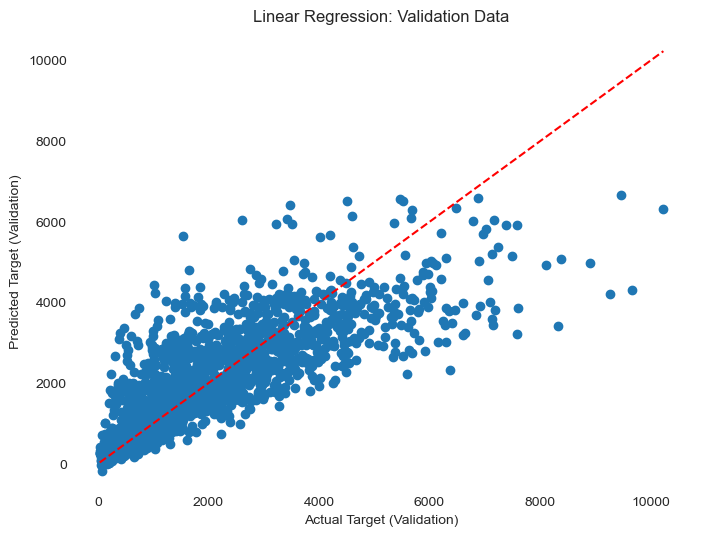

In [102]:
display_train_val_plots(grid_search.best_estimator_, X_train, X_val, y_train, y_val)

### 4. Select the final model

In [103]:
final_LR_model = grid_search.best_estimator_
final_LR_model

Pipeline(steps=[('poly', PolynomialFeatures()),
                ('ridge', Ridge(alpha=10.0, tol=10.0))])

In [104]:
# re-trained the final moodel in the whole train data
final_LR_model.fit(features, y)

Pipeline(steps=[('poly', PolynomialFeatures()),
                ('ridge', Ridge(alpha=10.0, tol=10.0))])

In [105]:
# Create the PolynomialFeatures & Ridge model
poly_model = PolynomialFeatures(degree=2)
ridge_model = Ridge(alpha=10.0, tol=10.0)

# Save both models in one file
models = {'polynomial_features': poly_model, 'ridge_model': ridge_model}
models_filename = 'polynomial_ridge_models.joblib'
joblib.dump(models, models_filename)

['polynomial_ridge_models.joblib']

## Random Forest

### 1. Split data & Build Base model

In [106]:
# Create the Random Forest Regression model
RFR_baseLine = RandomForestRegressor(random_state=42)
RFR_baseLine.fit(X_train, y_train)
y_pred = RFR_baseLine.predict(X_val)

In [107]:
# Calculate the mean squared error & R-squared
mse = np.sqrt(mean_squared_error(y_val, y_pred))
r2 = r2_score(y_val, y_pred)
print("Mean Squared Error:", mse)
print("R-squared:", r2)

Mean Squared Error: 1089.7123493047031
R-squared: 0.5631029867428528


### 2. diplay the baseline performance

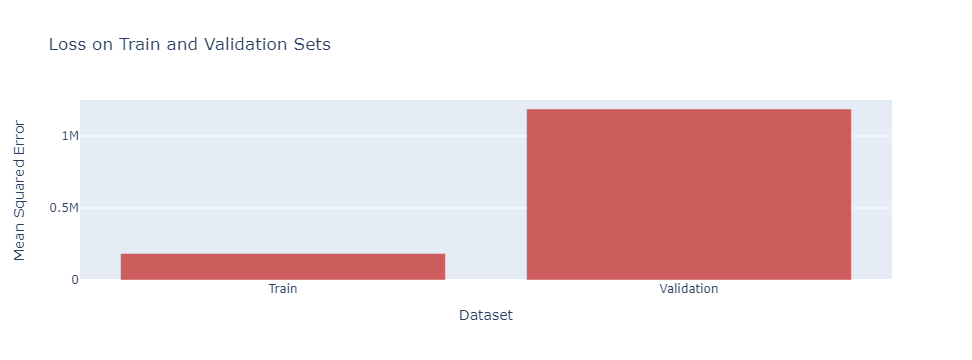

In [108]:
y_train_pred = RFR_baseLine.predict(X_train)
y_val_pred = RFR_baseLine.predict(X_val)

# loss
train_loss = mean_squared_error(y_train, y_train_pred)
val_loss = mean_squared_error(y_val, y_val_pred)

# visualize the loss
fig = go.Figure()
fig.add_trace(go.Bar(x=['Train', 'Validation'], y=[train_loss, val_loss], marker_color='indianred'))

fig.update_layout(title='Loss on Train and Validation Sets',
                  xaxis_title='Dataset',
                  yaxis_title='Mean Squared Error',
                  showlegend=False)

fig.show()

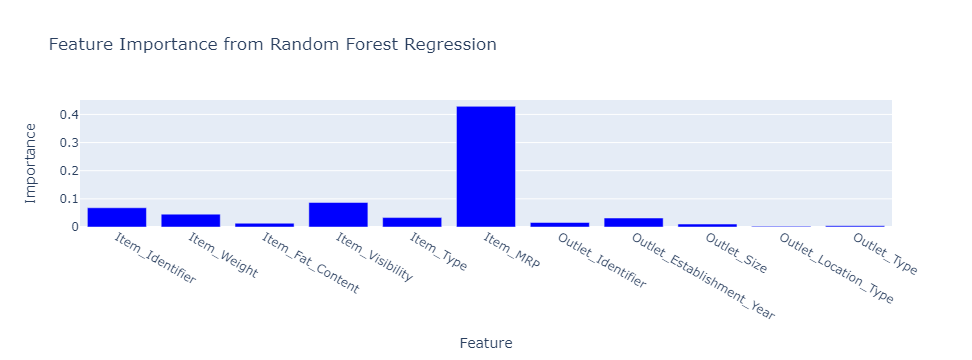

In [109]:
# Create a bar chart to visualize the important features
feature_importance = RFR_baseLine.feature_importances_
fig_importance = go.Figure()
fig_importance.add_trace(go.Bar(x=X.columns, y=feature_importance, marker_color='blue'))

fig_importance.update_layout(title='Feature Importance from Random Forest Regression',
                             xaxis_title='Feature',
                             yaxis_title='Importance',
                             showlegend=False)

fig_importance.show()

### 3. Search for the best fit line & Regularized the model

In [110]:
RFR_model = RandomForestRegressor()

rf_grid = {'n_estimators' : [100,200,500,800,1000,1200],
           'max_depth' : [3,5,7,10,15,25,40,None],
           'min_samples_split':[2,4,6,10],
           'min_samples_leaf':[2,4,6,8]   
           }

search = RandomizedSearchCV(RFR_model,rf_grid,scoring='neg_mean_squared_error',cv=3, verbose=2, n_jobs=6, n_iter = 50)
search.fit(features, y)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=50, n_jobs=6,
                   param_distributions={'max_depth': [3, 5, 7, 10, 15, 25, 40,
                                                      None],
                                        'min_samples_leaf': [2, 4, 6, 8],
                                        'min_samples_split': [2, 4, 6, 10],
                                        'n_estimators': [100, 200, 500, 800,
                                                         1000, 1200]},
                   scoring='neg_mean_squared_error', verbose=2)

In [111]:
RFR_best_model = search.best_estimator_ # Get the best model
y_train_pred = RFR_best_model.predict(X_train)
y_val_pred = RFR_best_model.predict(X_val)

mse_train = mean_squared_error(y_train, y_train_pred)
mse_val = mean_squared_error(y_val, y_val_pred)
r2_train = r2_score(y_train, y_train_pred)
r2_val = r2_score(y_val, y_val_pred)


# Print the MSE and best hyperparameters
print(f"Root-Mean Squared Error (RMSE) for training set: {np.sqrt(mse_train):.4f}")
print(f"Root-Mean Squared Error (RMSE) for validation set: {np.sqrt(mse_val):.4f}")
print(f"R-squared (R2) for training set: {r2_train}")
print(f"R-squared (R2) for validation set: {r2_val}")

# Print the R-squared score
score = RFR_best_model.score(X_val, y_val)
print(f"R-squared score (best_model): {score:.4f}")
print(f'best hyper parameters: {search.best_params_}')

Root-Mean Squared Error (RMSE) for training set: 1081.3524
Root-Mean Squared Error (RMSE) for validation set: 1007.0951
R-squared (R2) for training set: 0.6046980422067956
R-squared (R2) for validation set: 0.626838959260287
R-squared score (best_model): 0.6268
best hyper parameters: {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_depth': 5}


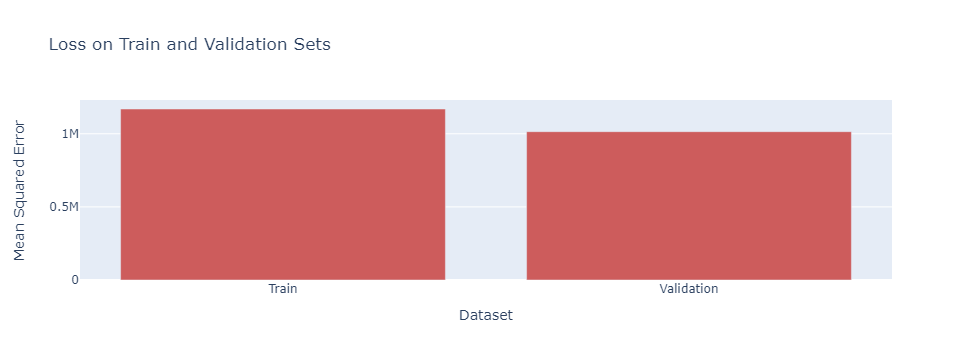

In [112]:
y_train_pred = RFR_best_model.predict(X_train)
y_val_pred = RFR_best_model.predict(X_val)

# loss
train_loss = mean_squared_error(y_train, y_train_pred)
val_loss = mean_squared_error(y_val, y_val_pred)

# visualize the loss
fig = go.Figure()
fig.add_trace(go.Bar(x=['Train', 'Validation'], y=[train_loss, val_loss], marker_color='indianred'))

fig.update_layout(title='Loss on Train and Validation Sets',
                  xaxis_title='Dataset',
                  yaxis_title='Mean Squared Error',
                  showlegend=False)

fig.show()

### 4. Select the final model

In [113]:
final_RFR_model = search.best_estimator_
final_RFR_model

RandomForestRegressor(max_depth=5, min_samples_leaf=8, min_samples_split=4,
                      n_estimators=200)

In [114]:
final_RFR_model.fit(features, y)

RandomForestRegressor(max_depth=5, min_samples_leaf=8, min_samples_split=4,
                      n_estimators=200)

In [115]:
# Save the model
model = final_RFR_model
model_filename = 'random_forest_regression_model.joblib'
joblib.dump(model, model_filename)

['random_forest_regression_model.joblib']

## XGBoost

### 1. Split data & Build Base model

In [116]:
# Create the XGBoost model
XGB_baseline = xgb.XGBRegressor(random_state=42)
XGB_baseline.fit(X_train, y_train)
y_val_pred = XGB_baseline.predict(X_val)

In [117]:
# Calculate the mean squared error & R-squared
rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
r2 = r2_score(y_val, y_val_pred)
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Root Mean Squared Error: 1119.3109741232952
R-squared: 0.5390467789984263


### 2. diplay the baseline performance

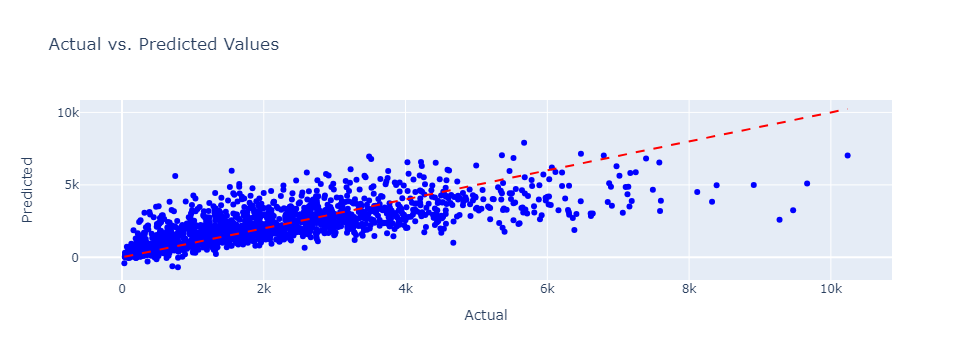

In [118]:
# Create a scatter plot to compare actual vs. predicted target values
scatter_fig = go.Figure()
scatter_fig.add_trace(go.Scatter(x=y_val, y=y_val_pred, mode='markers', marker=dict(color='blue')))
scatter_fig.add_trace(go.Scatter(x=[np.min(y_val), np.max(y_val)], y=[np.min(y_val), np.max(y_val)], mode='lines', name='Perfect Prediction', line=dict(color='red', dash='dash')))
scatter_fig.update_layout(title='Actual vs. Predicted Values',
                         xaxis_title='Actual',
                         yaxis_title='Predicted',
                         showlegend=False)
scatter_fig.show()

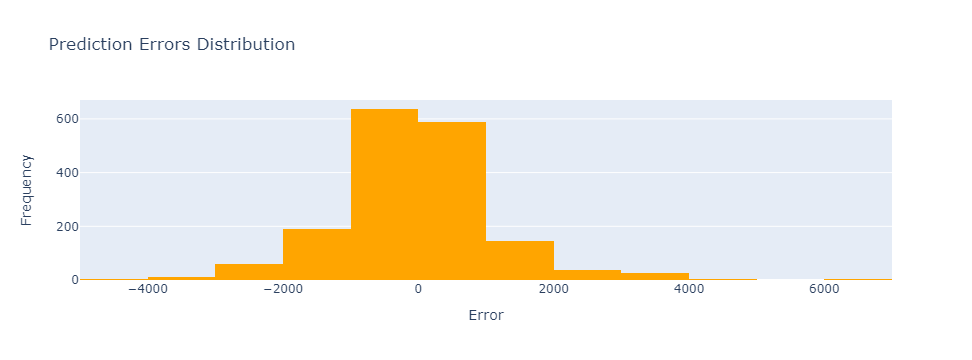

In [119]:
# Create a histogram to visualize the distribution of prediction errors
error_fig = go.Figure()
error = y_val - y_val_pred
error_fig.add_trace(go.Histogram(x=error, nbinsx=20, marker=dict(color='orange')))
error_fig.update_layout(title='Prediction Errors Distribution',
                        xaxis_title='Error',
                        yaxis_title='Frequency')

error_fig.show()

### 3. Search for the best fit line & Regularized the model

In [120]:
XGB_model = xgb.XGBRegressor(random_state=42)

# Define the parameter grid for grid search
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [3, 5, 7, 9]
}

grid_search = GridSearchCV(
    estimator=XGB_model,
    param_grid=param_grid,
    cv=KFold(n_splits=5),
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    i...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7, 9],
                         'n_estimators': [100, 200, 300, 400]},
             scoring='neg_mean_squared_error', verbose=2)

In [121]:
# best hyperparameters & model
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)
XGB_best_model = xgb.XGBRegressor(random_state=42, **best_params)
XGB_best_model.fit(X_train, y_train)
y_val_pred = XGB_best_model.predict(X_val)


val_loss = np.sqrt(mean_squared_error(y_val, y_val_pred))
print("Validation Loss (RMSE) with Best Model:", val_loss)

score = XGB_best_model.score(X_val, y_val)
print(f"R-squared score (best_model): {score:.4f}")

Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 400}
Validation Loss (RMSE) with Best Model: 1025.8679621461145
R-squared score (best_model): 0.6128


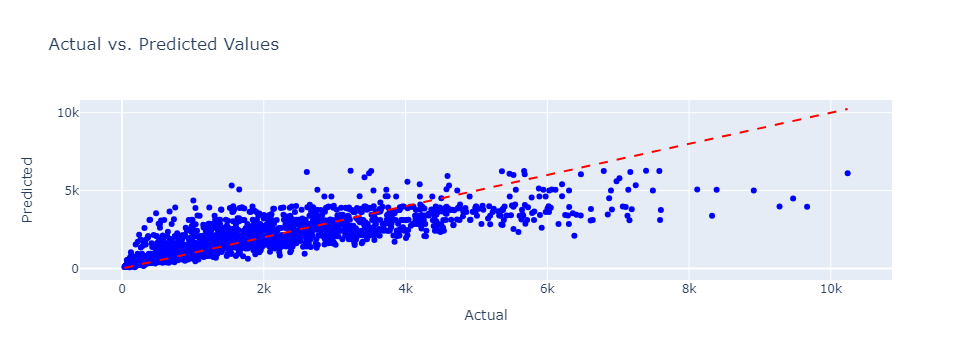

In [122]:
# Create a scatter plot to compare actual vs. predicted target values
scatter_fig = go.Figure()
scatter_fig.add_trace(go.Scatter(x=y_val, y=y_val_pred, mode='markers', marker=dict(color='blue')))
scatter_fig.add_trace(go.Scatter(x=[np.min(y_val), np.max(y_val)], y=[np.min(y_val), np.max(y_val)], mode='lines', name='Perfect Prediction', line=dict(color='red', dash='dash')))
scatter_fig.update_layout(title='Actual vs. Predicted Values',
                         xaxis_title='Actual',
                         yaxis_title='Predicted',
                         showlegend=False)
scatter_fig.show()

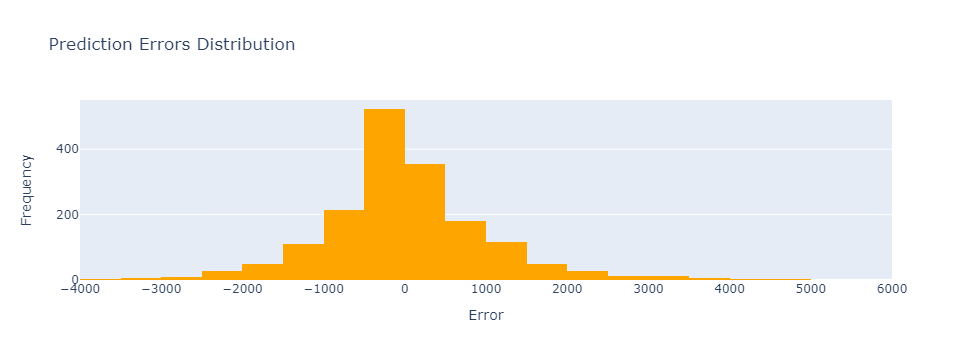

In [123]:
# Create a histogram to visualize the distribution of prediction errors
error_fig = go.Figure()
error = y_val - y_val_pred
error_fig.add_trace(go.Histogram(x=error, nbinsx=20, marker=dict(color='orange')))
error_fig.update_layout(title='Prediction Errors Distribution',
                        xaxis_title='Error',
                        yaxis_title='Frequency')

error_fig.show()

### 4. Select the final model

In [124]:
final_XGB_model = grid_search.best_estimator_
final_XGB_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=400, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [125]:
final_XGB_model.fit(features, y)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=400, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [126]:
# Save the model
model = final_XGB_model
model_filename = 'XGBoost_model.joblib'
joblib.dump(model, model_filename)

['XGBoost_model.joblib']

# 📰 summary

In [127]:
# Create a DataFrame to store the summary table
model_names = ['Linear Regression', 'Ridge Regression', 'Random Forest', 'XGBoost']

hyperparameters = [
    np.nan,
    'poly__degree: 2, ridge__alpha: 10.0, ridge__tol: 10.0',
    'n_estimators: 1200, min_samples_split: 10, min_samples_leaf: 8, max_depth: 5',
    'learning_rate: 0.01, max_depth: 3, n_estimators: 400'
]

R_squared_score = [0.5727, 0.6253, 0.6272, 0.6128]

summary_df = pd.DataFrame({
    'Model': model_names,
    'Hyperparameters': hyperparameters,
    'R-squared score': R_squared_score
})

display(summary_df)

,Model,Hyperparameters,R-squared score
0,Linear Regression,NaN,0.5727
1,Ridge Regression,"poly__degree: 2, ridge__alpha: 10.0, ridge__to...",0.6253
2,Random Forest,"n_estimators: 1200, min_samples_split: 10, min...",0.6272
3,XGBoost,"learning_rate: 0.01, max_depth: 3, n_estimator...",0.6128
